In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import networkx as nx
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams.update(mpl.rcParamsDefault)
import os
import math
import cmath
import latex
import matplotlib.cm as cm
import h5py
import matplotlib.colors as mc


# periodic kagome - new stuff

In [2]:
sublatt_dict={0: 'A', 7: 'B', 8: 'A', 9: 'A', 10: 'A', 11: 'A', 12: 'B', 13: 'B', 14: 'B', 15: 'B', 24: 'B', 40: 'B', 41: 'B', 42: 'B', 43: 'B', 44: 'A', 45: 'A', 46: 'A', 47: 'A', 48: 'B', 49: 'B', 50: 'B', 51: 'B', 52: 'A', 53: 'A', 54: 'A', 55: 'A', 63: 'B', 64: 'B', 71: 'A', 72: 'A', 73: 'A', 74: 'A', 75: 'A', 76: 'B', 77: 'B', 78: 'B', 79: 'B', 80: 'A', 81: 'A', 82: 'A', 83: 'A', 84: 'B', 85: 'B', 86: 'B', 87: 'B', 88: 'B', 95: 'B', 96: 'A', 104: 'B', 105: 'B', 106: 'B', 107: 'B', 108: 'A', 109: 'A', 110: 'A', 111: 'A', 112: 'B', 113: 'B', 114: 'B', 115: 'B', 116: 'A', 117: 'A', 118: 'A', 119: 'A', 120: 'A', 127: 'A', 128: 'B', 135: 'B', 136: 'A', 137: 'A', 138: 'A', 139: 'A', 140: 'B', 141: 'B', 142: 'B', 143: 'B', 144: 'A', 145: 'A', 146: 'A', 147: 'A', 148: 'B', 149: 'B', 150: 'B', 152: 'B', 159: 'B', 160: 'A', 168: 'B', 169: 'B', 170: 'B', 171: 'B', 172: 'A', 173: 'A', 174: 'A', 175: 'A', 176: 'B', 177: 'B', 178: 'B', 179: 'B', 180: 'A', 181: 'A', 182: 'A', 183: 'A', 191: 'B', 200: 'A', 201: 'A', 202: 'A', 203: 'A', 204: 'B', 205: 'B', 206: 'B', 207: 'B', 208: 'A', 209: 'A', 210: 'A', 211: 'A', 212: 'B', 213: 'B', 214: 'B', 215: 'B', 216: 'B', 223: 'B', 232: 'B', 233: 'B', 234: 'B', 235: 'B', 236: 'A', 237: 'A', 238: 'A', 239: 'A', 240: 'B', 241: 'B', 242: 'B', 243: 'B', 244: 'A', 245: 'A', 246: 'A', 247: 'A', 264: 'A', 265: 'A', 266: 'A', 267: 'A', 268: 'B', 269: 'B', 270: 'B', 271: 'B', 296: 'C', 297: 'C', 298: 'C', 299: 'C', 300: 'C', 301: 'C', 302: 'C', 303: 'C', 307: 'A', 310: 'A', 311: 'A', 318: 'B', 319: 'B', 324: 'A', 336: 'C', 337: 'C', 338: 'C', 339: 'C', 340: 'C', 341: 'C', 342: 'C', 343: 'C', 360: 'C', 361: 'C', 362: 'C', 363: 'C', 364: 'C', 365: 'C', 366: 'C', 367: 'C', 400: 'C', 401: 'C', 402: 'C', 403: 'C', 404: 'C', 405: 'C', 406: 'C', 407: 'C', 424: 'C', 425: 'C', 426: 'C', 427: 'C', 428: 'C', 429: 'C', 430: 'C', 431: 'C', 464: 'C', 465: 'C', 466: 'C', 467: 'C', 468: 'C', 469: 'C', 470: 'C', 471: 'C', 488: 'C', 489: 'C', 490: 'C', 491: 'C', 492: 'C', 493: 'C', 494: 'C', 495: 'C', 528: 'C', 529: 'C', 530: 'C', 531: 'C', 532: 'C', 533: 'C', 534: 'C', 535: 'C', 536: 'A', 537: 'A', 538: 'A', 539: 'A', 543: 'A', 550: 'A', 551: 'B', 552: 'C', 553: 'C', 554: 'C', 555: 'C', 556: 'C', 557: 'C', 558: 'C', 559: 'C'}
toremove=[
    63,191,551,223,159,95,7,
    324,120,310,311,307,160,96,0
]
sublatt_dict_trunc=sublatt_dict.copy()
for qubit in toremove:
    sublatt_dict_trunc.pop(qubit)
    
toremove2=[71,556,127,557,550,558,543,559,539,555,538,554,537,553,536,552,
           64,300,128,301,318,302,319,303,216,299,152,298,88, 297,24, 296,
           87,135,215,271,207,143,79, 15, 80, 144,208,264,200,136,72,8

]
sublatt_dict_truncer=sublatt_dict_trunc.copy()
for qubit in toremove2:
    sublatt_dict_truncer.pop(qubit)

Alist=[]
Blist=[]
Clist=[]
for key in sublatt_dict_trunc.keys():
    if sublatt_dict_trunc[key] == "A":
        Alist.append(key)
    if sublatt_dict_trunc[key] == "B":
        Blist.append(key)
    if sublatt_dict_trunc[key] == "C":
        Clist.append(key)
print("number of points per sublattice")
print("A, B, C")
print(len(Alist),len(Blist),len(Clist))

Alist2=[]
Blist2=[]
Clist2=[]
for key in sublatt_dict_truncer.keys():
    if sublatt_dict_truncer[key] == "A":
        Alist2.append(key)
    if sublatt_dict_truncer[key] == "B":
        Blist2.append(key)
    if sublatt_dict_truncer[key] == "C":
        Clist2.append(key)
print("number of points per sublattice")
print("A, B, C")
print(len(Alist2),len(Blist2),len(Clist2))

number of points per sublattice
A, B, C
72 72 72
number of points per sublattice
A, B, C
56 56 56


In [3]:
allsites=sublatt_dict.keys()
allsites_down=sublatt_dict_trunc.keys()
allsites_down_good=sublatt_dict_truncer.keys()

In [4]:
twochains_period=[(204, 382), (220, 342), (45, 412), (93, 404), (30, 488), (14, 472), (238, 511), (286, 471), (143, 525), (123, 533), (239, 567), (279, 535), (252, 343), (268, 351), (135, 541), (24, 312), (88, 313), (152, 314), (216, 315), (319, 256), (318, 192), (128, 325), (64, 316), (536, 39), (537, 103), (538, 167), (539, 231), (543, 255), (550, 199), (71, 548), (0, 320), (324, 56), (96, 321), (120, 317), (160, 322), (310, 184), (307, 224), (311, 248), (7, 544), (63, 540), (95, 545), (159, 546), (191, 542), (223, 547), (551, 263)]
nodes_period=[0, 7, 8, 9, 10, 11, 12, 13, 14, 15, 24, 30, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 63, 64, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 93, 95, 96, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 123, 127, 128, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 152, 159, 160, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 191, 192, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 220, 223, 224, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 252, 255, 256, 263, 264, 265, 266, 267, 268, 269, 270, 271, 279, 286, 296, 297, 298, 299, 300, 301, 302, 303, 307, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 324, 325, 336, 337, 338, 339, 340, 341, 342, 343, 351, 360, 361, 362, 363, 364, 365, 366, 367, 382, 400, 401, 402, 403, 404, 405, 406, 407, 412, 424, 425, 426, 427, 428, 429, 430, 431, 464, 465, 466, 467, 468, 469, 470, 471, 472, 488, 489, 490, 491, 492, 493, 494, 495, 511, 525, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 567]
all_couplers_from_site = [(0, 296), (0, 40), (7, 552), (7, 47), (8, 12), (8, 296), (8, 336), (8, 24), (9, 13), (9, 360), (9, 12), (9, 400), (10, 14), (10, 424), (10, 13), (10, 464), (11, 15), (11, 488), (11, 14), (11, 528), (12, 360), (12, 336), (13, 424), (13, 400), (14, 488), (14, 464), (15, 552), (15, 528), (15, 536), (24, 296), (40, 296), (40, 44), (40, 340), (41, 360), (41, 45), (41, 404), (41, 44), (42, 424), (42, 46), (42, 468), (42, 45), (43, 488), (43, 47), (43, 532), (43, 46), (44, 360), (44, 340), (45, 424), (45, 404), (46, 488), (46, 468), (47, 552), (47, 532), (48, 300), (48, 52), (48, 336), (48, 324), (49, 400), (49, 52), (49, 364), (49, 53), (50, 464), (50, 53), (50, 428), (50, 54), (51, 528), (51, 54), (51, 492), (51, 55), (52, 336), (52, 364), (53, 400), (53, 428), (54, 464), (54, 492), (55, 556), (55, 528), (55, 63), (63, 556), (64, 300), (64, 80), (71, 556), (71, 87), (72, 76), (72, 297), (72, 340), (72, 88), (73, 77), (73, 361), (73, 76), (73, 404), (74, 78), (74, 425), (74, 77), (74, 468), (75, 79), (75, 489), (75, 78), (75, 532), (76, 361), (76, 340), (77, 425), (77, 404), (78, 489), (78, 468), (79, 553), (79, 532), (79, 537), (80, 84), (80, 300), (80, 337), (81, 84), (81, 401), (81, 85), (81, 364), (82, 85), (82, 465), (82, 86), (82, 428), (83, 86), (83, 529), (83, 87), (83, 492), (84, 337), (84, 364), (85, 401), (85, 428), (86, 465), (86, 492), (87, 556), (87, 529), (88, 297), (95, 553), (95, 111), (96, 297), (96, 104), (104, 297), (104, 108), (104, 341), (105, 361), (105, 109), (105, 405), (105, 108), (106, 425), (106, 110), (106, 469), (106, 109), (107, 489), (107, 111), (107, 533), (107, 110), (108, 361), (108, 341), (109, 425), (109, 405), (110, 489), (110, 469), (111, 553), (111, 533), (112, 301), (112, 116), (112, 337), (112, 120), (113, 401), (113, 116), (113, 365), (113, 117), (114, 465), (114, 117), (114, 429), (114, 118), (115, 529), (115, 118), (115, 493), (115, 119), (116, 337), (116, 365), (117, 401), (117, 429), (118, 465), (118, 493), (119, 557), (119, 529), (120, 301), (127, 557), (127, 135), (128, 301), (128, 144), (135, 557), (135, 530), (135, 147), (136, 140), (136, 298), (136, 341), (136, 152), (137, 141), (137, 362), (137, 140), (137, 405), (138, 142), (138, 426), (138, 141), (138, 469), (139, 143), (139, 490), (139, 142), (139, 533), (140, 362), (140, 341), (141, 426), (141, 405), (142, 490), (142, 469), (143, 554), (143, 533), (143, 538), (144, 148), (144, 301), (144, 338), (145, 148), (145, 402), (145, 149), (145, 365), (146, 149), (146, 466), (146, 150), (146, 429), (147, 150), (147, 530), (147, 493), (148, 338), (148, 365), (149, 402), (149, 429), (150, 466), (150, 493), (152, 298), (159, 554), (159, 175), (160, 298), (160, 168), (168, 298), (168, 172), (168, 342), (169, 362), (169, 173), (169, 406), (169, 172), (170, 426), (170, 174), (170, 470), (170, 173), (171, 490), (171, 175), (171, 534), (171, 174), (172, 362), (172, 342), (173, 426), (173, 406), (174, 490), (174, 470), (175, 554), (175, 534), (176, 302), (176, 180), (176, 338), (176, 310), (177, 402), (177, 180), (177, 366), (177, 181), (178, 466), (178, 181), (178, 430), (178, 182), (179, 530), (179, 182), (179, 494), (179, 183), (180, 338), (180, 366), (181, 402), (181, 430), (182, 466), (182, 494), (183, 558), (183, 530), (183, 191), (191, 558), (200, 204), (200, 299), (200, 342), (200, 216), (201, 205), (201, 363), (201, 204), (201, 406), (202, 206), (202, 427), (202, 205), (202, 470), (203, 207), (203, 491), (203, 206), (203, 534), (204, 363), (204, 342), (205, 427), (205, 406), (206, 491), (206, 470), (207, 555), (207, 534), (207, 539), (208, 212), (208, 302), (208, 339), (208, 318), (209, 212), (209, 403), (209, 213), (209, 366), (210, 213), (210, 467), (210, 214), (210, 430), (211, 214), (211, 531), (211, 215), (211, 494), (212, 339), (212, 366), (213, 403), (213, 430), (214, 467), (214, 494), (215, 558), (215, 531), (215, 550), (216, 299), (223, 555), (223, 239), (232, 299), (232, 236), (232, 343), (232, 307), (233, 363), (233, 237), (233, 407), (233, 236), (234, 427), (234, 238), (234, 471), (234, 237), (235, 491), (235, 239), (235, 535), (235, 238), (236, 363), (236, 343), (237, 427), (237, 407), (238, 491), (238, 471), (239, 555), (239, 535), (240, 303), (240, 244), (240, 339), (240, 311), (241, 367), (241, 245), (241, 403), (241, 244), (242, 431), (242, 246), (242, 467), (242, 245), (243, 495), (243, 247), (243, 531), (243, 246), (244, 367), (244, 339), (245, 431), (245, 403), (246, 495), (246, 467), (247, 559), (247, 531), (247, 551), (264, 268), (264, 343), (264, 303), (264, 319), (265, 268), (265, 407), (265, 269), (265, 367), (266, 269), (266, 471), (266, 270), (266, 431), (267, 270), (267, 535), (267, 271), (267, 495), (268, 343), (268, 367), (269, 407), (269, 431), (270, 471), (270, 495), (271, 535), (271, 559), (271, 543), (299, 307), (300, 324), (302, 318), (302, 310), (303, 319), (303, 311), (536, 552), (537, 553), (538, 554), (539, 555), (543, 559), (550, 558), (551, 559)]

In [5]:
all_sites = []
for n in range(len(list(sublatt_dict.keys()))):
    qubit = list(sublatt_dict.keys())[n]
    index = np.where(np.array(nodes_period) == qubit)[0][0]
    all_sites.append(index)

all_down_triangles = []
for n in range(len(list(sublatt_dict_trunc.keys()))):
    qubit = list(sublatt_dict_trunc.keys())[n]
    index = np.where(np.array(nodes_period) == qubit)[0][0]
    all_down_triangles.append(index)

all_good_down_triangles = []
for n in range(len(list(sublatt_dict_truncer.keys()))):
    qubit = list(sublatt_dict_truncer.keys())[n]
    index = np.where(np.array(nodes_period) == qubit)[0][0]
    all_good_down_triangles.append(index)

In [6]:
list_sites_a = []
list_sites_b = []
actual_couples_to_measure = []
for n in range(len(list(sublatt_dict_truncer.keys()))):
    qubit = list(sublatt_dict_truncer.keys())[n]
    for tuple_couple in all_couplers_from_site:
        if qubit == tuple_couple[0] or qubit == tuple_couple[1]:
            actual_couples_to_measure.append(tuple_couple)

del_dup_couples = [*set(actual_couples_to_measure)]
for i in range(len(del_dup_couples)):
    asite = np.where(np.array(nodes_period) == del_dup_couples[i][0])[0][0]
    list_sites_a.append(asite)
    bsite = np.where(np.array(nodes_period) == del_dup_couples[i][1])[0][0]
    list_sites_b.append(bsite)

# anneal offsets

In [7]:
data = pd.read_excel('./annealing_schedule.xlsx',  sheet_name='processor-annealing-schedule') 
s_vals = pd.DataFrame(data, columns=['s'])
A_vals = pd.DataFrame(data, columns=['A(s) (GHz)'])
B_vals = pd.DataFrame(data, columns=['B(s) (GHz)'])
cs_vals = pd.DataFrame(data, columns=['C (normalized)'])
first_s = s_vals.to_numpy().flatten()
first_A = A_vals.to_numpy().flatten()
first_B = B_vals.to_numpy().flatten()
first_c = cs_vals.to_numpy().flatten()


In [8]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

new_s = np.linspace(0,1,num = 100*len(first_s))
new_A = np.interp(new_s, first_s, first_A)
new_B = np.interp(new_s, first_s, first_B)
new_c = np.interp(new_s, first_s, first_c)

A2divB = np.divide(new_A**2,new_B)

indices = len(new_A)*np.ones(len(new_A),dtype=np.int8)
# delta_c = np.zeros(len(new_A))
differences = np.zeros(len(new_A))

for i in range(len(new_A)):
    val = find_nearest(A2divB, value = new_A[i])
    differences[i]= A2divB[val] - new_A[i]
    indices[i] = val 
    


In [9]:
hoffset_s = np.divide(new_B,2*new_B[indices])
J22_s = np.divide(new_B,new_B[indices])
J12_s = np.divide(2*new_B,new_B + new_B[indices])
delta_c = new_c[indices] - new_c



# Reverse quench-pause-forward quench

In [2]:
# tlist=[1000.0, 500.0, 100.0, 50.0, 10.0]
tlist=[100]
# slist=np.linspace(0.05,0.95,19)
slist=np.linspace(0.05, 0.85, 17)


In [11]:
folder = list(
    Path(
        '/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /Reverse anneal offsets rescaled/h=2/minit=-0.33/processed'
    ).glob('*'))
for file in folder:
    if str(file).split('/')[-1]!='.DS_Store':
        name=Path(file).stem
        locals()[name]=np.load(file)  
        print(name)

phis
energies
mags
resps
brokens


In [12]:
# fig,ax=plt.subplots(2,3,figsize=(10,6),dpi=200)
# # colors = plt.cm.brg(np.linspace(0,1,19))
# sp_range=np.arange(0.3,0.65,0.05)
# sp_range=slist
# colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))

# for i in range(len(energies)):
#     jcol=0
#     tp=tlist[i]
#     if i<=2:
#         axj=ax[0][i]
#     else:
#         axj=ax[1][i-3]
#     for j in range(len(energies[i])):
#         sp=slist[j]
#         if round(sp_range[0],2) <= round(sp,2) <= round(sp_range[-1],2):
#             Edist=[]
#             for k in range(len(energies[i][j])):
#                 Edist.append(energies[i][j][k][100:])
#             Edist=np.array(Edist).flatten()
#             axj.hist(x=Edist,label=round(sp,2),log=False,alpha=0.3,color=colors[jcol])
#             jcol += 1
#             axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))

# xlabel=r'$E$'
# ylabel=r'$ Frequency $'            
# for axis in ax.flat:
#     axis.set(xlabel=xlabel, ylabel=ylabel)
#     axis.grid()
# #     axis.set(xlim=(-235, -226))
#     axis.label_outer()
            
# handles,labels=ax[0][0].get_legend_handles_labels()
# fig.legend(handles, labels, title= r'$ s_p $')
# # plt.subplots_adjust(top=3)

# plt.show()

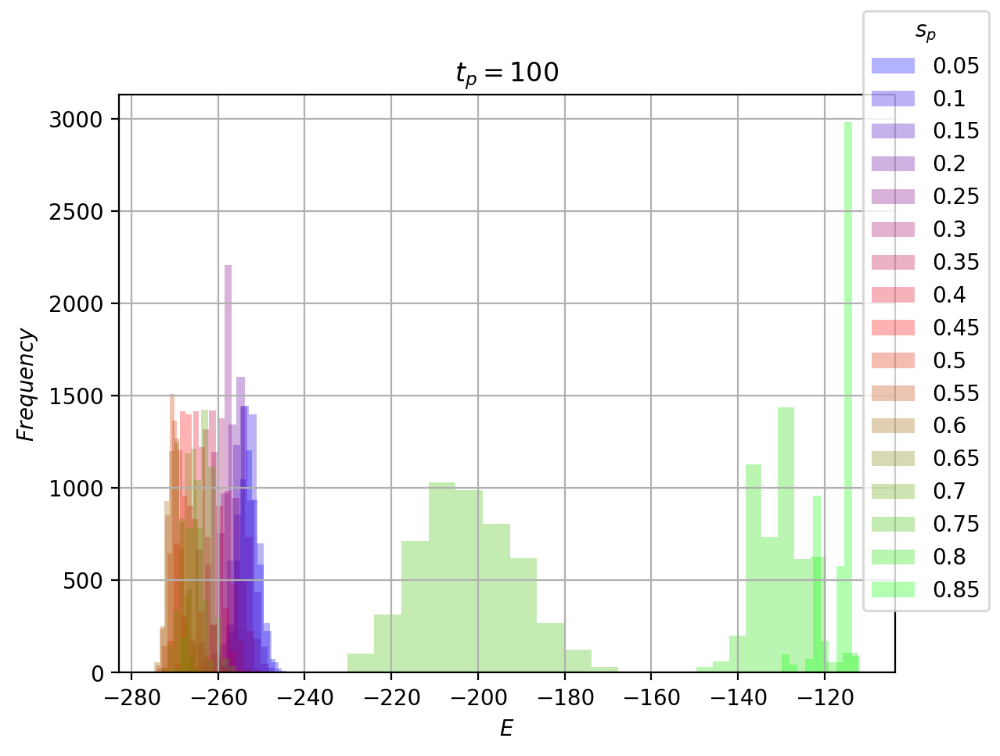

In [13]:
fig,ax=plt.subplots(1,dpi=200)
# colors = plt.cm.brg(np.linspace(0,1,19))
sp_range=np.arange(0.05,0.85,0.05)
sp_range=slist
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))

jcol=0
tp=tlist[0]
axj=ax
for j in range(len(energies[0])):
    sp=slist[j]
    if round(sp_range[0],2) <= round(sp,2) <= round(sp_range[-1],2):
        Edist=[]
        for k in range(len(energies[0][j])):
            Edist.append(energies[0][j][k][100:])
        Edist=np.array(Edist).flatten()
        axj.hist(x=Edist,label=round(sp,2),log=False,alpha=0.3,color=colors[jcol])
        jcol += 1
        axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
        xlabel=r'$E$'
        ylabel=r'$ Frequency $'
        axj.set(xlabel=xlabel, ylabel=ylabel)
        axj.grid()            

            
handles,labels=axj.get_legend_handles_labels()
fig.legend(handles, labels, title= r'$ s_p $')
# plt.subplots_adjust(top=3)

plt.show()

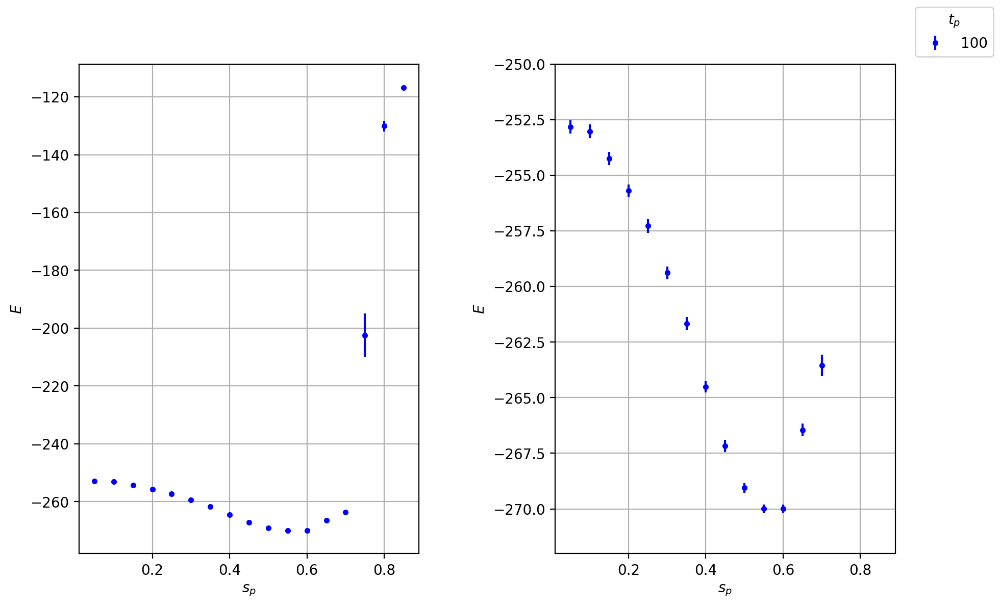

In [28]:
colors = plt.cm.brg(np.linspace(0,1,len(tlist)))
fig,ax=plt.subplots(1,2,figsize=(10,6),dpi=200)

for i in range(len(energies)):
    tp=tlist[i]
    Es_sp=[]
    for j in range(len(energies[i])):
        sp=slist[j]
        Es_last100=[]
        for k in range(len(energies[i][j])):
            Es_last100.append(energies[i][j][k][100:])
        Es_sp.append(Es_last100)
    Es_sp=np.array(Es_sp)
#     print(len(np.mean(np.mean(Es_sp,axis=1),axis=1)))
    
    ax[0].errorbar(
        slist,
        np.mean(np.mean(Es_sp,axis=1),axis=1),
        np.std(np.mean(Es_sp,axis=1),axis=1),
        fmt='.',
        label=int(tp),
        color=colors[i]
    )
    ax[1].errorbar(
        slist,
        np.mean(np.mean(Es_sp,axis=1),axis=1),
        np.std(np.mean(Es_sp,axis=1),axis=1),
        fmt='.',
        label=int(tp),
        color=colors[i]
    )
xlabel=r'$s_p$'
ylabel=r'$ E $'            
for axis in ax.flat:
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.grid()
    
ax[1].set_ylim((-272,-250))
ax[1].set_xlim(auto=True)
    
handles,labels=ax[0].get_legend_handles_labels()
fig.legend(handles, labels, title= r'$ t_p $')
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.show()

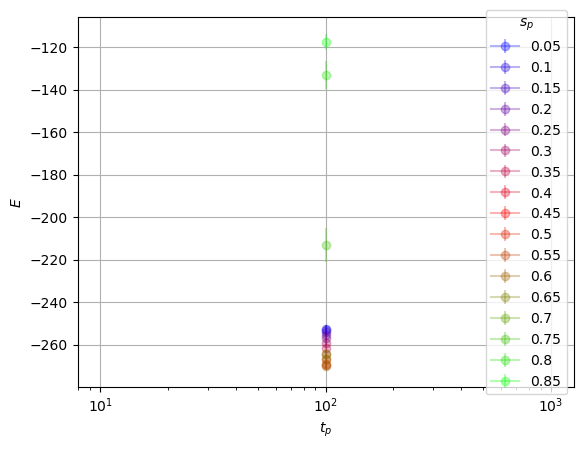

In [15]:
colors = plt.cm.brg(np.linspace(0,1,len(slist)))
lastE_means_tp=[]
lastE_vars_tp=[]
for i in range(len(energies)):
    
    lastE_means=[]
    lastE_vars=[]
    
    for j in range(len(energies[i])):
        lastE_mean=np.mean(energies[i][j],axis=0)[-1]
        lastE_var=np.std(energies[i][j],axis=0)[-1]
        
        lastE_means.append(lastE_mean)
        lastE_vars.append(lastE_var)

    lastE_means_tp.append(lastE_means)
    lastE_vars_tp.append(lastE_vars)
    
lastE_means_tp=np.array(lastE_means_tp)
lastE_vars_tp=np.array(lastE_vars_tp)

for i in range(len(slist)):
    sp=slist[i]
    Elist=lastE_means_tp[:,i]
    varlist=lastE_vars_tp[:,i]
    plt.errorbar(
        tlist,
        Elist,
        varlist,
        fmt='o-',
        color=colors[i],
        label=round(sp,2),
        alpha=0.3
    )
plt.xscale('log')
#plt.yscale('log')
plt.grid('on')
plt.xlabel(r'$ t_p $')
plt.ylabel(r'$ E $')
# plt.ylim(-235,-220)
plt.legend(title= r'$ s_p $',loc='right')
plt.show()

In [16]:
# fig,ax=plt.subplots(2,3,figsize=(10,6),dpi=500)
# sp_range=np.arange(0.05,1,0.05)
# colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))
        
# for i in range(len(mags)):
    
#     jcol=0
#     tp=tlist[i]
#     if i<=2:
#         axj=ax[0][i]
#     else:
#         axj=ax[1][i-3]
    
#     tp=tlist[i]
#     for j in range(len(mags[i])):
#         sp=slist[j]
#         magseries_mean=np.mean(mags[i][j],axis=0)
#         magseries_var= np.std(mags[i][j],axis=0)
#         axj.errorbar(
#             np.linspace(1,200,200),
#             magseries_mean,
#             magseries_var,
#             color=colors[jcol],
#             label=round(sp,2),
#             fmt='.',
#             ms=0.5,
#             lw=0.1
#         )
# #         axj.scatter(
# #             np.linspace(1,200,200),
# #             magseries_mean,
# #             color=colors[jcol],
# #             label=round(sp,2),
# #             s=1
# #         )
#         axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
#         jcol+=1

# xlabel=r'$ t $'
# ylabel=r'$ \langle m_{tri} \rangle $'            
# for axis in ax.flat:
#     axis.set(xlabel=xlabel, ylabel=ylabel)
#     axis.grid()
#     axis.label_outer()
            
# handles,labels=ax[0][0].get_legend_handles_labels()
# fig.legend(handles, labels, title= r'$ s_p $')

# plt.show()

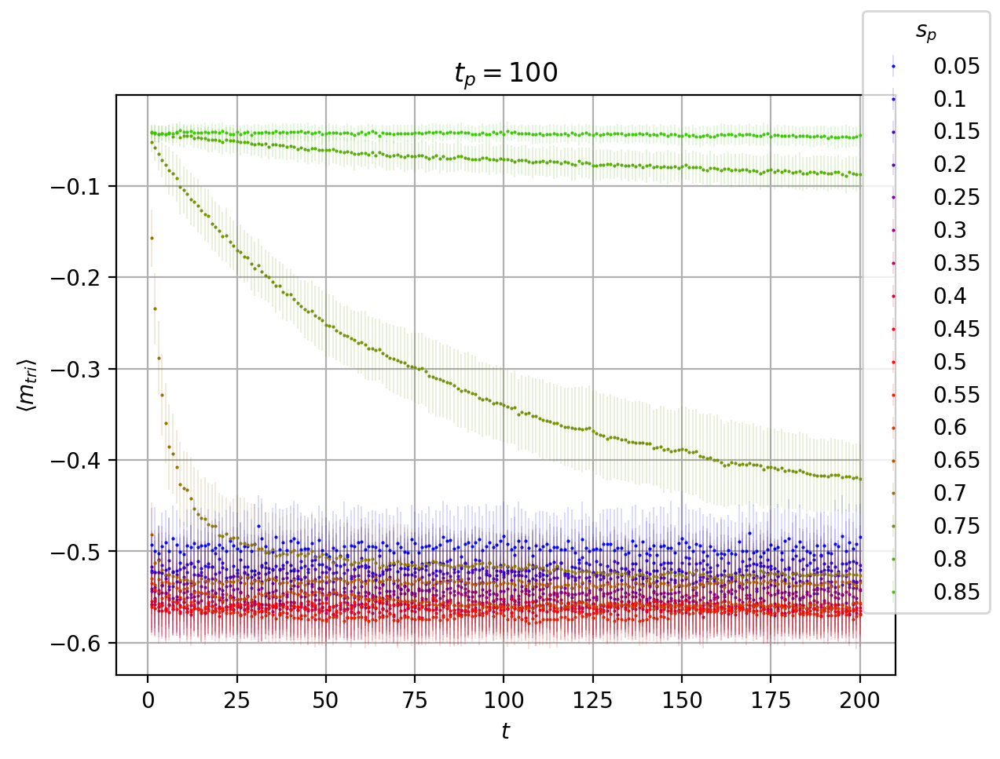

In [29]:
fig,ax=plt.subplots(1,dpi=200)
sp_range=np.arange(0.05,1,0.05)
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))
        
    
jcol=0
tp=tlist[0]
axj=ax
for j in range(len(mags[0])):
    sp=slist[j]
    magseries_mean=np.mean(mags[i][j],axis=0)
    magseries_var= np.std(mags[i][j],axis=0)
    axj.errorbar(
        np.linspace(1,200,200),
        magseries_mean,
        magseries_var,
        color=colors[jcol],
        label=round(sp,2),
        fmt='.',
        ms=1,
        lw=0.1
    )
#         axj.scatter(
#             np.linspace(1,200,200),
#             magseries_mean,
#             color=colors[jcol],
#             label=round(sp,2),
#             s=1
#         )
    axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
    xlabel=r'$ t $'
    ylabel=r'$ \langle m_{tri} \rangle $'
    axj.set(xlabel=xlabel, ylabel=ylabel)
    axj.grid()
    jcol+=1

            
handles,labels=axj.get_legend_handles_labels()
fig.legend(handles, labels, title= r'$ s_p $')

plt.show()

In [18]:
# fig,ax=plt.subplots(2,3,figsize=(10,6),dpi=200)
# sp_range=np.arange(0.05,1,0.05)
# colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))

# for i in range(len(mags)):
#     jcol=0
#     tp=tlist[i]
#     if i<=2:
#         axj=ax[0][i]
#     else:
#         axj=ax[1][i-3]
#     for j in range(len(mags[i])):
#         sp=slist[j]
#         if sp_range[0] <= sp <= sp_range[-1]:
#             magdist=[]
#             for k in range(len(mags[i][j])):
#                 magdist.append(mags[i][j][k][100:])
#             magdist=np.array(magdist).flatten()
#             axj.hist(x=magdist,label=round(sp,2),log=False,alpha=0.5,color=colors[jcol])
#             jcol += 1
#             axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
            
# xlabel=r'$ \langle m_{tri} \rangle $'
# ylabel=r'$ Frequency $'            
# for axis in ax.flat:
#     axis.set(xlabel=xlabel, ylabel=ylabel)
#     axis.grid()
# #     axis.set(xlim=(-235, -226))
#     axis.label_outer()
            
# handles,labels=ax[0][0].get_legend_handles_labels()
# fig.legend(handles, labels, title= r'$ s_p $')
# # plt.subplots_adjust(top=3)

# plt.show()

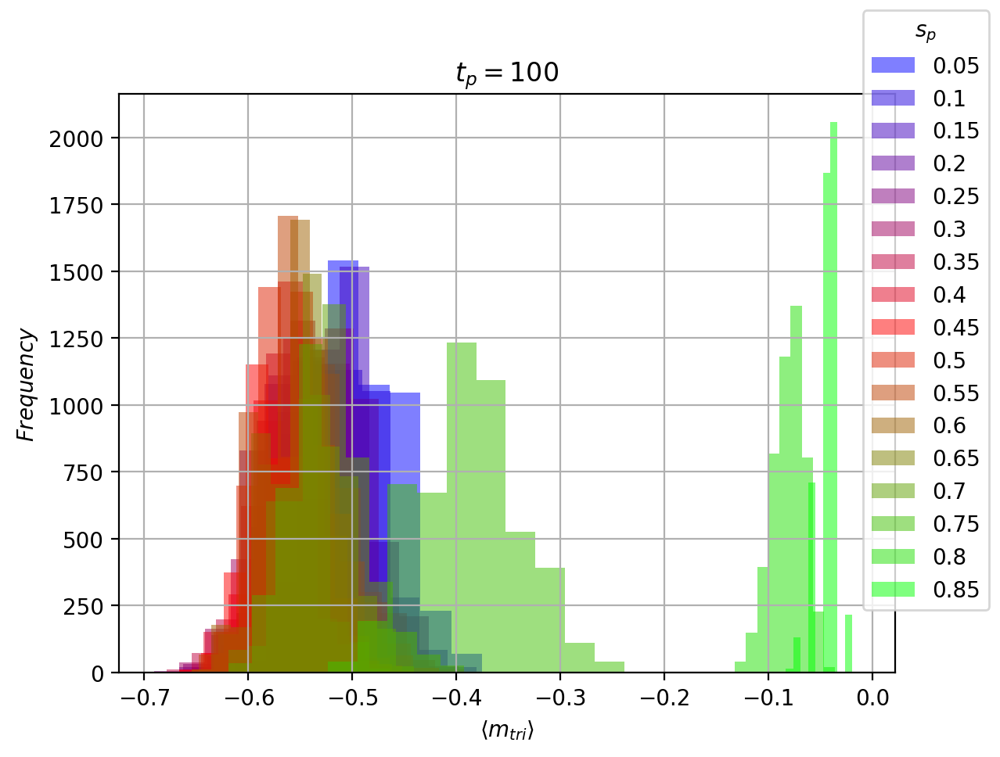

In [30]:
fig,ax=plt.subplots(1,dpi=200)
sp_range=np.arange(0.05,0.9,0.05)
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))

jcol=0
tp=tlist[0]
axj=ax
for j in range(len(mags[0])):
    sp=slist[j]
    if sp_range[0] <= sp <= sp_range[-1]:
        magdist=[]
        for k in range(len(mags[0][j])):
            magdist.append(mags[0][j][k][100:])
        magdist=np.array(magdist).flatten()
        axj.hist(x=magdist,label=round(sp,2),log=False,alpha=0.5,color=colors[jcol])
        jcol += 1
        axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
            
        xlabel=r'$ \langle m_{tri} \rangle $'
        ylabel=r'$ Frequency $'            
        axj.set(xlabel=xlabel, ylabel=ylabel)
        axj.grid()
        #     axis.set(xlim=(-235, -226))
        axj.label_outer()
            
handles,labels=axj.get_legend_handles_labels()
fig.legend(handles, labels, title= r'$ s_p $')
# plt.subplots_adjust(top=3)

plt.show()

In [20]:
# fig,ax=plt.subplots(2,3,figsize=(10,6),dpi=500)
# sp_range=np.arange(0.05,1,0.05)
# colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))
        
# for i in range(len(phis)):
    
#     jcol=0
#     tp=tlist[i]
#     if i<=2:
#         axj=ax[0][i]
#     else:
#         axj=ax[1][i-3]
    
#     tp=tlist[i]
#     for j in range(len(phis[i])):
#         sp=slist[j]
#         phiseries_mean=np.mean(np.abs(phis[i][j]),axis=0)
#         phiseries_var= np.std(np.abs(phis[i][j]),axis=0)
# #         axj.errorbar(
# #             np.linspace(1,200,200),
# #             phiseries_mean,
# #             phiseries_var,
# #             color=colors[jcol],
# #             label=round(sp,2),
# #             fmt='.',
# #             ms=0.1,
# #             lw=0.05
# #         )
#         axj.scatter(
#             np.linspace(1,200,200),
# #             np.abs(phiseries_mean),
#             phiseries_mean/3,
#             color=colors[jcol],
#             label=round(sp,2),
#             s=0.5
#         )
#         axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
#         jcol+=1

# xlabel=r'$ t $'
# ylabel=r'$ |\phi| $'            
# for axis in ax.flat:
#     axis.set(xlabel=xlabel, ylabel=ylabel)
#     axis.grid()
#     axis.label_outer()
            
# handles,labels=ax[0][0].get_legend_handles_labels()
# fig.legend(handles, labels, title= r'$ s_p $')

# plt.show()

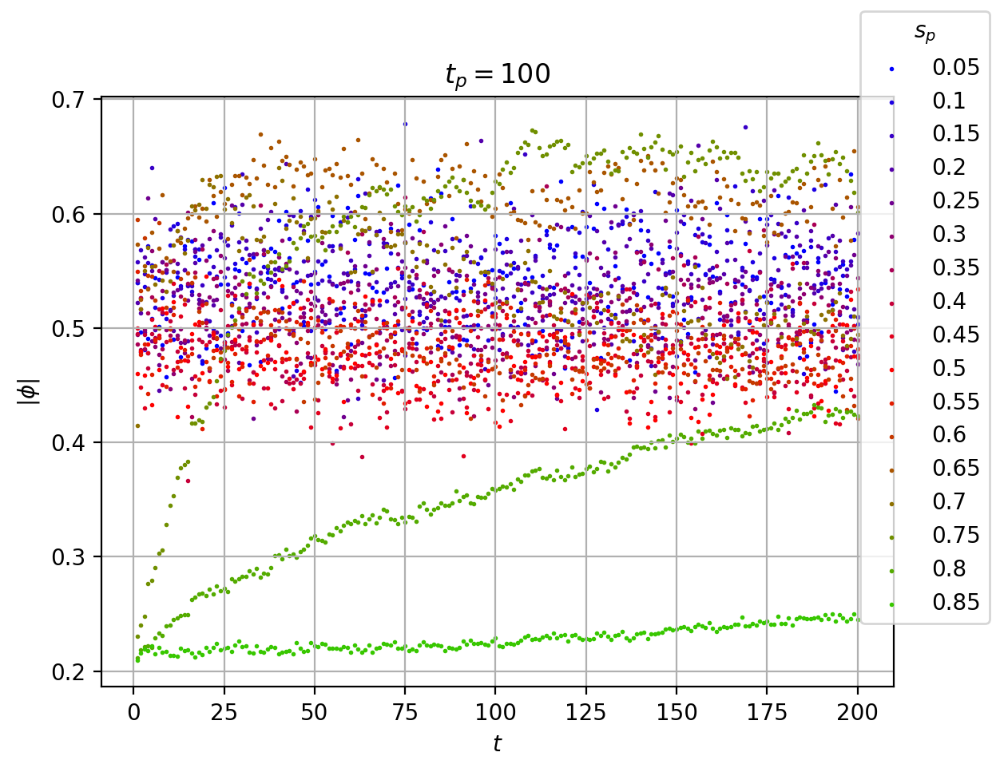

In [21]:
fig,ax=plt.subplots(1,dpi=200)
sp_range=np.arange(0.05,1,0.05)
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))
        
    
jcol=0
tp=tlist[0]
axj=ax
for j in range(len(phis[0])):
    sp=slist[j]
    phiseries_mean=np.mean(np.abs(phis[0][j]),axis=0)
    phiseries_var= np.std(np.abs(phis[0][j]),axis=0)
#         axj.errorbar(
#             np.linspace(1,200,200),
#             phiseries_mean,
#             phiseries_var,
#             color=colors[jcol],
#             label=round(sp,2),
#             fmt='.',
#             ms=0.1,
#             lw=0.05
#         )
    axj.scatter(
        np.linspace(1,200,200),
#             np.abs(phiseries_mean),
        phiseries_mean,
        color=colors[jcol],
        label=round(sp,2),
        s=1
    )
    axj.set_title(r'$ t_p = {tp} $'.format(tp=int(tp)))
    xlabel=r'$ t $'
    ylabel=r'$ |\phi| $'
    axj.set(xlabel=xlabel, ylabel=ylabel)
    axj.grid()
    jcol+=1
        
            
handles,labels=axj.get_legend_handles_labels()
fig.legend(handles, labels, title= r'$ s_p $')

plt.show()

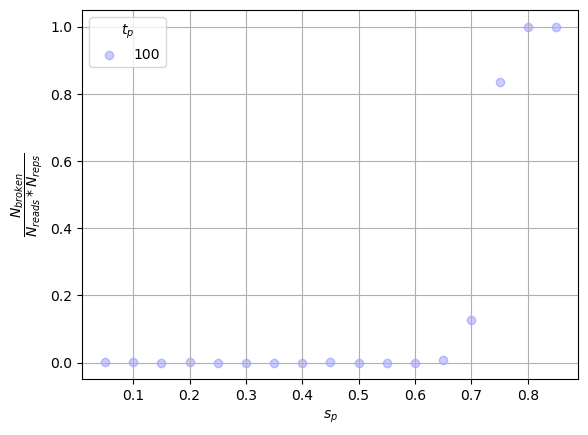

In [22]:
# colors = plt.cm.brg(np.linspace(0,1,19))
colors = plt.cm.brg(np.linspace(0,1,len(tlist)))
for i in range(len(brokens)):
    tp=tlist[i]
    plt.scatter(
        slist,
        brokens[i]/(200*50),
        color=colors[i],
        label=tp,
        alpha=0.2
    )
plt.legend(title=r'$ t_p $')
plt.grid('on')
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$\dfrac{N_{broken}}{N_{reads}*N_{reps}}$')
plt.show()        

In [23]:
energies.shape


(1, 17, 50, 200)

# periodic test

In [137]:
# tlist=[1000.0, 500.0, 100.0, 50.0, 10.0]
h=0
# slist=np.linspace(0.05,0.95,19)
slist=np.linspace(0.25,0.85,31)

In [138]:
folder = list(
    Path(
        '/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /Periodic Kagome reverse anneal test 2/h1=0.0/processed'
    ).glob('*'))
for file in folder:
    if str(file).split('/')[-1]!='.DS_Store':
        name=Path(file).stem
        locals()[name]=np.load(file)  
        print(name)

phis
avgbrokens
energies
mags3
mags2
mags1
resps
brokens


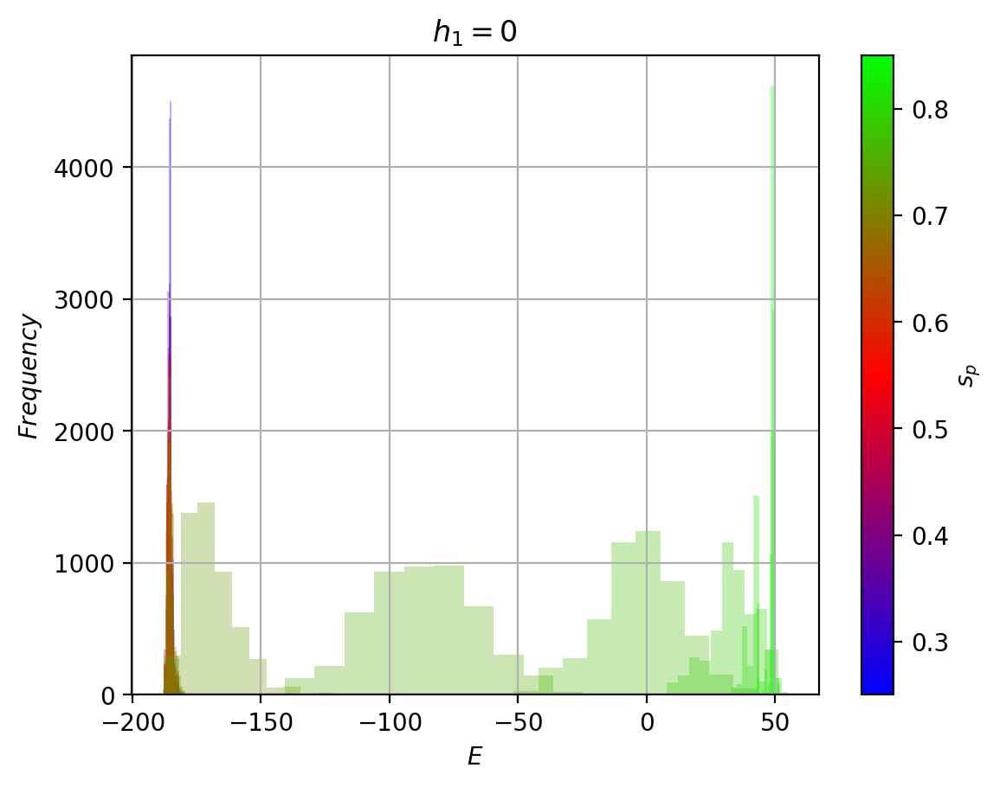

In [139]:
fig, ax = plt.subplots(1, dpi=200)

sp_range = np.arange(0.25, 0.87, 0.02)
colors = cm.brg(np.linspace(0, 1, len(sp_range)))

jcol = 0
axj = ax
for j in range(len(energies[0])):
    sp = slist[j]
    if round(sp_range[0], 2) <= round(sp, 2) <= round(sp_range[-1], 2):
        Edist = []
        for k in range(len(energies[0][j])):
            Edist.append(energies[0][j][k][100:])
        Edist = np.array(Edist).flatten()
        axj.hist(x=Edist, label=round(sp, 2), log=False, alpha=0.3, color=colors[jcol])
        jcol += 1
        axj.set_title(r'$ h_1 = {h1} $'.format(h1=int(h)))
        xlabel = r'$E$'
        ylabel = r'$ Frequency $'
        axj.set(xlabel=xlabel, ylabel=ylabel)
        axj.grid()

# Create a ScalarMappable object using the colormap and normalize it
sm = cm.ScalarMappable(cmap=cm.brg)
sm.set_array(sp_range)

# Add colorbar
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label(r'$ s_p $')

plt.show()


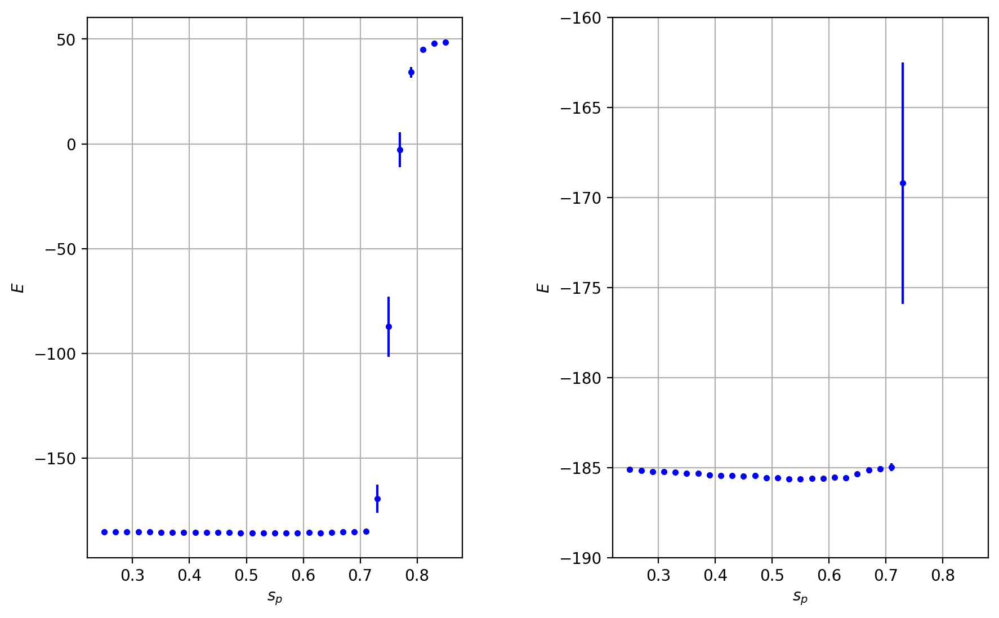

In [140]:
# colors = plt.cm.brg(np.linspace(0,1,len(tlist)))
fig,ax=plt.subplots(1,2,figsize=(10,6),dpi=200)

for i in range(len(energies)):
    Es_sp=[]
    for j in range(len(energies[i])):
        sp=slist[j]
        Es_last100=[]
        for k in range(len(energies[i][j])):
            Es_last100.append(energies[i][j][k][100:])
        Es_sp.append(Es_last100)
    Es_sp=np.array(Es_sp)
#     print(len(np.mean(np.mean(Es_sp,axis=1),axis=1)))
    
    ax[0].errorbar(
        slist,
        np.mean(np.mean(Es_sp,axis=1),axis=1),
        np.std(np.mean(Es_sp,axis=1),axis=1),
        fmt='.',
        color=colors[i]
    )
    ax[1].errorbar(
        slist,
        np.mean(np.mean(Es_sp,axis=1),axis=1),
        np.std(np.mean(Es_sp,axis=1),axis=1),
        fmt='.',
        color=colors[i]
    )
xlabel=r'$s_p$'
ylabel=r'$ E $'            
for axis in ax.flat:
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.grid()
    
ax[1].set_ylim((-190,-160))
ax[1].set_xlim(auto=True)
    
handles,labels=ax[0].get_legend_handles_labels()
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.show()

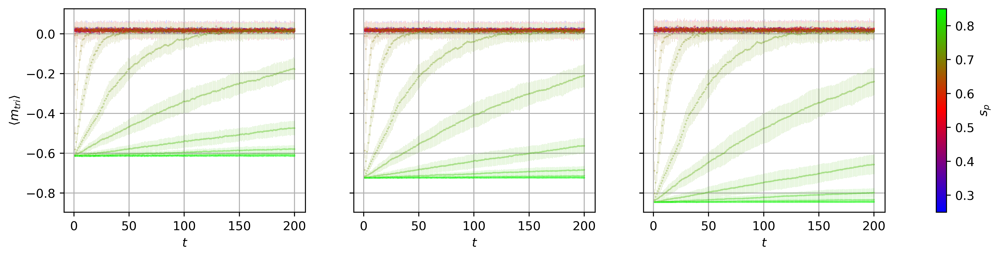

In [141]:
fig, ax = plt.subplots(1,3, figsize=(15,3), dpi=500, sharey=True)

sp_range = np.arange(0.25, 0.87, 0.02)
colors = cm.brg(np.linspace(0, 1, len(sp_range)))
mags = [mags1, mags2, mags3]

for i in range(len(mags)):

    jcol = 0
    axj = ax[i]

    for j in range(len(mags[i][0])):
        sp = slist[j]
        magseries_mean = np.mean(mags[i][0][j], axis=0)
        magseries_var = np.std(mags[i][0][j], axis=0)
        axj.errorbar(
            np.linspace(1, 200, 200),
            magseries_mean,
            magseries_var,
            color=colors[jcol],
            label=round(sp, 2),
            fmt='.',
            ms=0.3,
            lw=0.1
        )
        jcol += 1

xlabel = r'$ t $'
ylabel = r'$ \langle m_{tri} \rangle $'
for axis in ax.flat:
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.grid()
    axis.label_outer()

# Create a ScalarMappable object using the colormap and normalize it
sm = cm.ScalarMappable(cmap=cm.brg)
sm.set_array(sp_range)

# Add colorbar
cbar = fig.colorbar(sm, ax=ax, shrink=1)
cbar.set_label(r'$ s_p $')

plt.show()


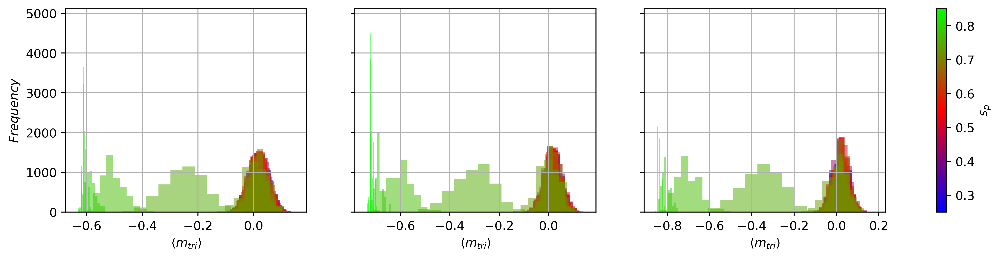

In [142]:
fig, ax = plt.subplots(1,3, figsize=(15,3), dpi=500, sharey=True)
sp_range = np.arange(0.25, 0.87, 0.02)
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))

for i in range(len(mags)):
    jcol=0
    axj=ax[i]
    for j in range(len(mags[i][0])):
        sp=slist[j]
        if sp_range[0] <= sp <= sp_range[-1]:
            magdist=[]
            for k in range(len(mags[i][0][j])):
                magdist.append(mags[i][0][j][k][100:])
            magdist=np.array(magdist).flatten()
            axj.hist(x=magdist,label=round(sp,2),log=False,alpha=0.5,color=colors[jcol])
            jcol += 1
            
xlabel=r'$ \langle m_{tri} \rangle $'
ylabel=r'$ Frequency $'            
for axis in ax.flat:
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.grid()
#     axis.set(xlim=(-235, -226))
    axis.label_outer()
            
cbar = fig.colorbar(sm, ax=ax, shrink=1)
cbar.set_label(r'$ s_p $')

plt.show()

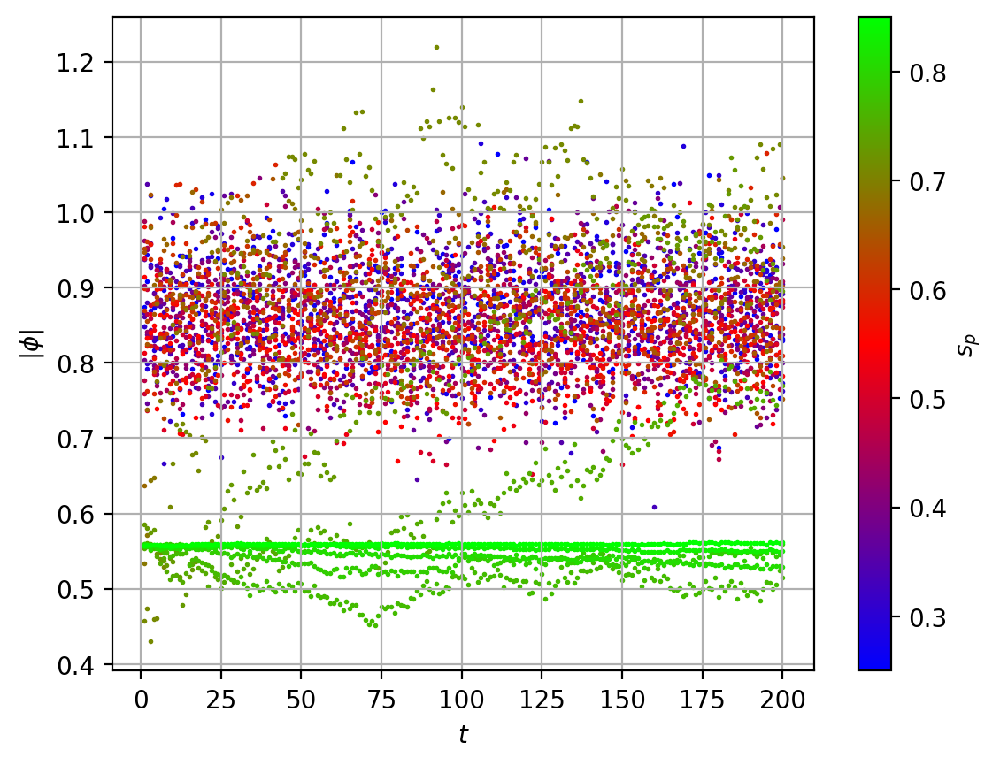

In [143]:
fig,ax=plt.subplots(1,dpi=200)
colors = plt.cm.brg(np.linspace(0,1,len(sp_range)))
        
    
jcol=0
axj=ax
for j in range(len(phis[0])):
    sp=slist[j]
    phiseries_mean=np.mean(np.abs(phis[0][j]),axis=0)
    phiseries_var= np.std(np.abs(phis[0][j]),axis=0)
    axj.scatter(
        np.linspace(1,200,200),
        phiseries_mean,
        color=colors[jcol],
        label=round(sp,2),
        s=1
    )
    xlabel=r'$ t $'
    ylabel=r'$ |\phi| $'
    axj.set(xlabel=xlabel, ylabel=ylabel)
    axj.grid()
    jcol+=1
        
cbar = fig.colorbar(sm, ax=ax, shrink=1)
cbar.set_label(r'$ s_p $')            

plt.show()

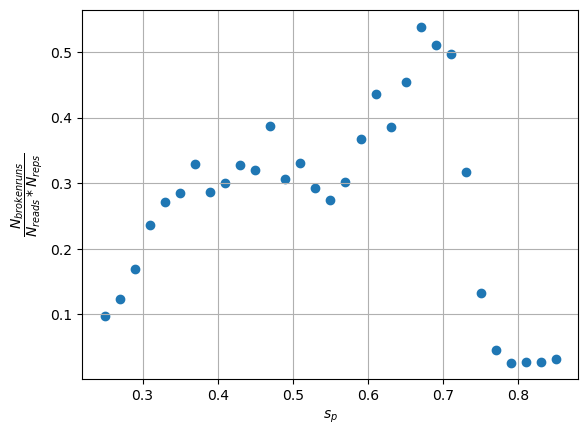

In [144]:
for i in range(len(brokens)):
    plt.scatter(
        slist,
        brokens[i]/(200*50),
        alpha=1
    )
plt.grid('on')
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$\dfrac{N_{brokenruns}}{N_{reads}*N_{reps}}$')
plt.show()       

In [145]:
print(avgbrokens[0].shape)

(31, 50)


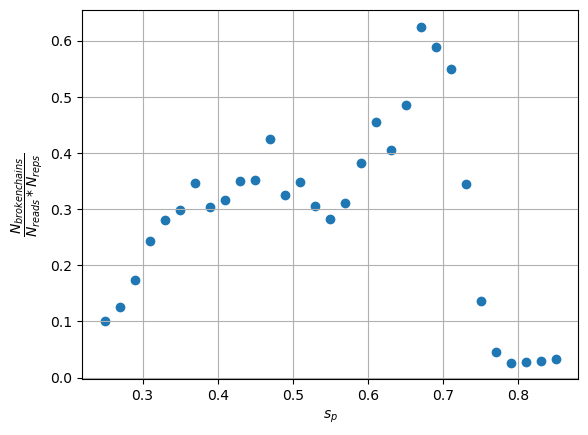

In [146]:
for i in range(len(avgbrokens)):
    ylist=[]
    for j in range(len(avgbrokens[i])):
        ylist.append(np.mean(avgbrokens[i][j]))
    plt.scatter(
        slist,
        ylist
    )
plt.grid('on')
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$\dfrac{N_{brokenchains}}{N_{reads}*N_{reps}}$')
plt.show()

# periodic fwd

In [967]:
h1list=np.linspace(-4,4,51)
h1list

array([-4.  , -3.84, -3.68, -3.52, -3.36, -3.2 , -3.04, -2.88, -2.72, -2.56, -2.4 , -2.24, -2.08, -1.92, -1.76, -1.6 , -1.44, -1.28, -1.12, -0.96, -0.8 , -0.64, -0.48, -0.32, -0.16,  0.  ,  0.16,  0.32,  0.48,  0.64,  0.8 ,  0.96,  1.12,  1.28,  1.44,  1.6 ,  1.76,  1.92,  2.08,  2.24,  2.4 ,  2.56,  2.72,  2.88,  3.04,  3.2 ,  3.36,  3.52,  3.68,  3.84,  4.  ])

In [17]:
folder = list(
    Path(
        '/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /periodic Kagome fwd2/processed'
    ).glob('*'))
for file in folder:
    if str(file).split('/')[-1]!='.DS_Store':
        name=Path(file).stem
        locals()[name]=np.load(file,allow_pickle=True)  
        print(name)

energies
mags3
mags2
mags1
resps


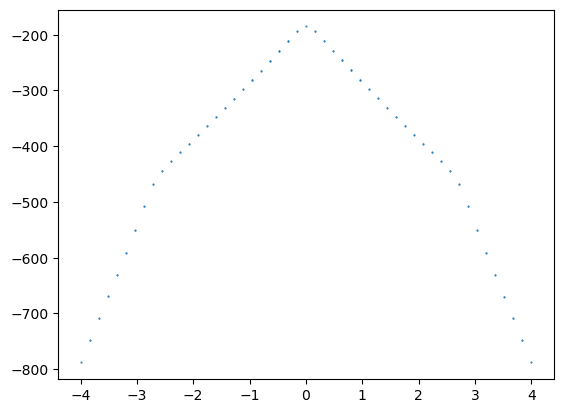

In [5]:
avgEs=[]
sdEs=[]
for i in range(len(energies)):
    avgEs.append(np.mean((energies[i])))
    sdEs.append(np.std(energies[i]))
    
plt.errorbar(
    h1list,avgEs,sdEs,
    fmt='.',
    ms=1,
    lw=1,
)
plt.show()

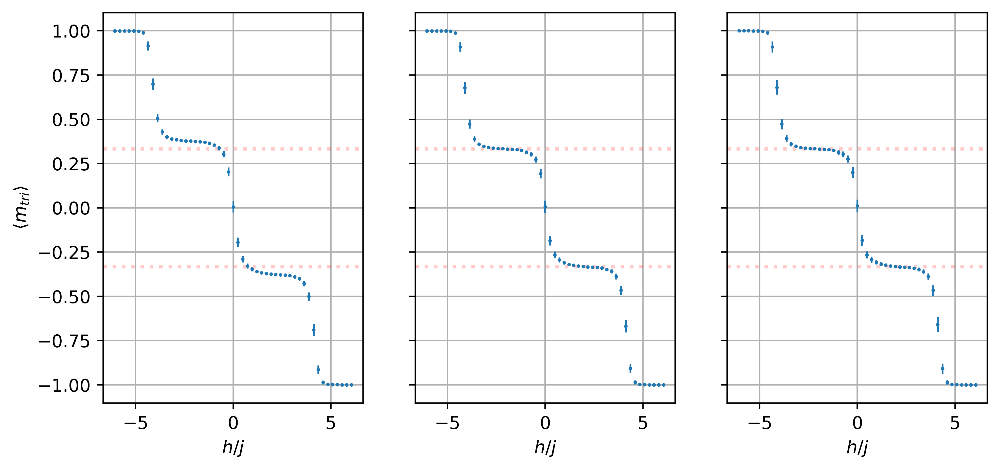

In [11]:
fig, ax = plt.subplots(1,3, figsize=(9,4), dpi=500, sharey=True)


jcol = 0
axj = ax[i]

avgmags=[]
sdmags=[]

for j in range(len(mags[i])):
    avgmags.append(np.mean(mags[i][j]))
    sdmags.append(np.std(mags[i][j]))
    axj.errorbar(
        h1list/0.6609157922190527,
        avgmags,
        sdmags,
        fmt='.',
        ms=2,
        lw=1
    )
    #     axj.set_yticks([-1,-3/4,-1/2,-1/4,0])
    #     axj.set_yticks([-1/3],minor=True)
    #     axj.set_yticklabels(axj.get_yticks())

    axj.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.2, lw=2)  # Extend horizontal line across the plots
    axj.axhline(y=1/3, color='r', linestyle='dotted', alpha=0.2, lw=2)  # Extend horizontal line across the plots

xlabel = r'$ h/j $'
ylabel = r'$ \langle m_{tri} \rangle $'
for axis in ax.flat:
    axis.set(xlabel=xlabel, ylabel=ylabel)
#     axis.set_yticks([-1/3] + list(axis.get_yticks()))  # Include -1/3 in the y-axis tick values
#     axis.set_yticklabels(['-1/3'] + [str(tick) for tick in axis.get_yticks()])  # Set -1/3 as a y-axis tick label
    axis.grid()
    axis.label_outer()
    

plt.show()


# periodic fwd - different js

In [8]:
h1list_fwd=np.linspace(0,4,26)
jlist_fwd= [0.66,0.83,1.0,1.4]
hoverjlist_fwd = np.array([h1list_fwd/jlist_fwd[0] , h1list_fwd/jlist_fwd[1] , h1list_fwd/jlist_fwd[2]])




In [9]:
gen_path = "../../data_prathus_runs"

folder2 = list(
    Path(
         gen_path + '/periodic Kagome fwd2/processed'
    ).glob('*'))
folder3 = list(
    Path(
        gen_path + '/periodic Kagome fwd3/processed'
    ).glob('*'))
folder4 = list(
    Path(
        gen_path + '/periodic Kagome fwd4/processed'
    ).glob('*'))
folder5 = list(
    Path(
        gen_path + '/periodic Kagome fwd5/processed'
    ).glob('*'))
folderlist=[folder2,folder3,folder4,folder5]

num=2
for folder in folderlist:
    for file in folder:
        #print(str(file).split('/')[-1][-10:])
        if str(file).split('/')[-1][-10:] !='Identifier':
            
            name=Path(file).stem + "_" + str(num)
            locals()[name]=np.load(file,allow_pickle=True)  
            print(name)
    num+=1

resps_2
classE2_2
mags2_2
classE1_2
mags1_2
mags3_2
energies_2
resps_3
classE2_3
mags2_3
classE1_3
mags1_3
mags3_3
energies_3
resps_4
classE2_4
mags2_4
classE1_4
mags1_4
mags3_4
energies_4
resps_5
classE2_5
mags2_5
classE1_5
mags1_5
mags3_5
energies_5


In [10]:
energies_2_sliced = energies_2[25:]
mags3_2_sliced = mags3_2[25:]
mags2_2_sliced = mags2_2[25:]
mags1_2_sliced = mags1_2[25:]
resps_2_sliced = resps_2[25:]
classE1_2_sliced = classE1_2[25:]

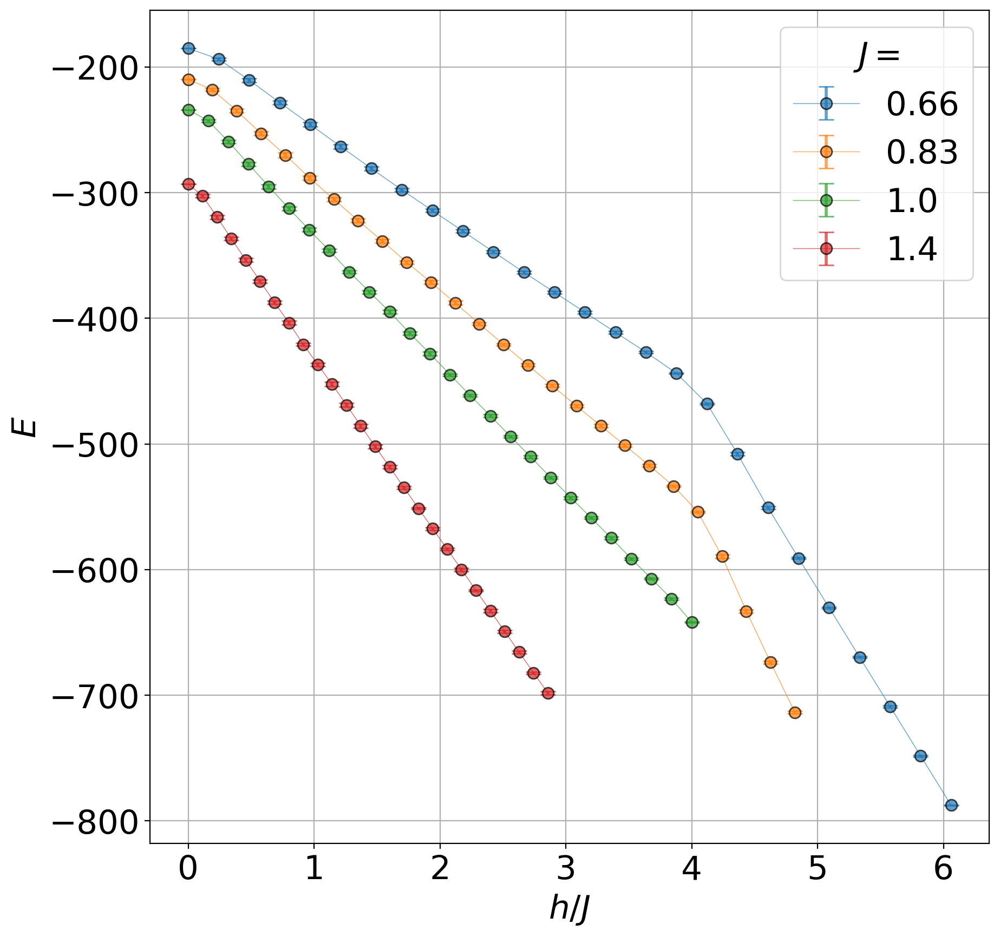

In [11]:
plt.figure(figsize=(10,10), dpi=200)

energies_list = [energies_2_sliced,energies_3,energies_4,energies_5]

num=2
for energies in energies_list:
    avgEs=[]
    sdEs=[]
    for i in range(len(energies)):
        avgEs.append(np.mean((energies[i])))
        sdEs.append(np.std(energies[i]))

    plt.errorbar(
        h1list_fwd/jlist_fwd[num-2],
        np.array(avgEs),
        sdEs,
        ms=15,
        fmt='.-',
        lw=0.5,
        elinewidth=2,
        capsize=5,
        alpha=0.7,
        markeredgecolor='black',
        label= str(jlist_fwd[num-2])
    )
    num+=1
    
plt.xlabel(r'$h/J$')
plt.ylabel(r'$E$')
plt.grid()
plt.legend(title=r'$J=$')
plt.show()

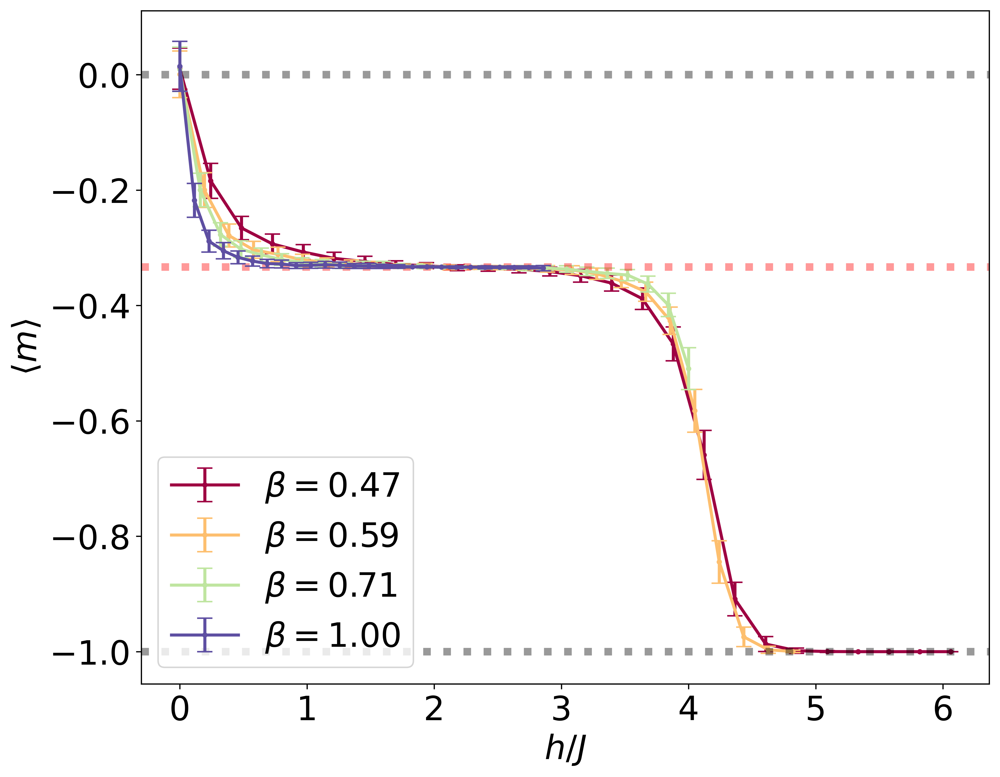

In [17]:
# fig, ax = plt.subplots(1,2, figsize=(10,5), dpi=500, sharey=True)
plt.figure(figsize=(10,8))
plt.rcParams['figure.dpi'] = 600
plt.rcParams.update({'font.size':22})
mags_biglist = [
    [
        mags1_2_sliced, mags2_2_sliced, mags3_2_sliced
    ],
    [
        mags1_3,        mags2_3,        mags3_3
    ],
    [
        mags1_4,        mags2_4,        mags3_4
    ],
    [
        mags1_5,        mags2_5,        mags3_5
    ]
]

cmap = plt.colormaps['Spectral']

for i in range(len(mags_biglist)):
    jval=jlist_fwd[i]
#     magslist=mags_biglist[i]
    
#     for j in range(len(magslist)):
#     for j in range(len([magslist[0]])):
        
#         mags = [magslist[0],magslist[2]][j]

#         axj = ax[j]
    
#         avgmags=[]
#         sdmags=[]

#         for k in range(len(mags)):
#             avgmags.append(np.mean(mags[k]))
#             sdmags.append(np.std(mags[k]))
#         print(len(avgmags))
            
    mags=mags_biglist[i][2]
    avgmags=[]
    sdmags=[]
    for k in range(len(mags)):
        avgmags.append(np.mean(mags[k]))
        sdmags.append(np.std(mags[k]))
            
    plt.errorbar(
        h1list_fwd/jval,
        avgmags,
        sdmags,
        fmt='.-',
        ms=5,
        lw=2,
        capsize=5,
        elinewidth=2,
        zorder = i,
        # label=r"$J=$" + str(jval) + r"; $\Gamma=0$"
        # label=r"$k_B T/J=${:.3f}".format(0.0372/jval) + r"; $\Gamma=0$"
        # label=r"$J^{-1}=$" + "{:.3f}".format(1/jval),
        label=r"$\beta=$" + "{:.2f}".format(jval/1.4),
        color = cmap(i/3)
    )
    
# plt.errorbar(
#     hoverjlist,
#     gooddowntri_mag_arr[:,0,0],
#     gooddowntri_mag_arr[:,1,0],
#     fmt='.-',
#     ms=15,
#     lw=0.5,
#     capsize=5,
#     elinewidth=2,
#     label = r'$ J=0.66; \Gamma \gg J $',
#     zorder=0
# )
# plt.text(0.35,-0.15, r'$ J=0.66; \Gamma \gg J $')
    
plt.axhline(y=0, color='black', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.axhline(y=-1, color='black', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots

plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
# plt.grid()

xlabel = r'$ h/J $'
ylabel = r'$ \langle m \rangle $'
# for axis in ax.flat:
#     axis.set(xlabel=xlabel, ylabel=ylabel)
# #     axis.set_yticks([-1/3] + list(axis.get_yticks()))  # Include -1/3 in the y-axis tick values
# #     axis.set_yticklabels(['-1/3'] + [str(tick) for tick in axis.get_yticks()])  # Set -1/3 as a y-axis tick label
#     axis.grid()
#     axis.label_outer()

plt.xlabel(xlabel)
plt.ylabel(ylabel)


plt.legend(loc = 'lower left')
plt.show()


In [19]:
for i in range(10,1, -1): 
    print(i)

10
9
8
7
6
5
4
3
2


In [ ]:
num=2
for j in range(len(energies_list)):
    
    energies=energies_list[j]
    jval=jlist_fwd[j]
    
    avgEs=[]
    sdEs=[]
    for i in range(len(energies)):
        avgEs.append(np.mean((energies[i])))
        sdEs.append(np.std(energies[i]))
    
    avgmags=[]
    sdmags=[]
    mags=mags_biglist[j][0]
    for k in range(len(mags)):
        avgmags.append(np.mean(mags[k]))
        sdmags.append(np.std(mags[k]))
        

    plt.errorbar(
        h1list_fwd/jval,
        np.array(avgEs)/jval - 
        (h1list_fwd/jval * 231 * avgmags)
        +90,
        np.power((h1list_fwd/jval),2) * np.power(sdEs,2) + np.power((h1list_fwd/jval),2) * np.power(sdmags,2),
        fmt='.',
        ms=2,
        lw=1,
        label= str(jval)
    )
    num+=1
    
plt.xlabel(r'$ h/J $')
plt.ylabel(r'$ E/J - h/J \langle m \rangle  $')
plt.grid()
plt.legend(title=r'$J=$')
plt.show()

In [21]:
np.array(sorted(list(h1list_fwd) + list(-1*h1list_fwd)))

array([-4.  , -3.84, -3.68, -3.52, -3.36, -3.2 , -3.04, -2.88, -2.72,
       -2.56, -2.4 , -2.24, -2.08, -1.92, -1.76, -1.6 , -1.44, -1.28,
       -1.12, -0.96, -0.8 , -0.64, -0.48, -0.32, -0.16,  0.  , -0.  ,
        0.16,  0.32,  0.48,  0.64,  0.8 ,  0.96,  1.12,  1.28,  1.44,
        1.6 ,  1.76,  1.92,  2.08,  2.24,  2.4 ,  2.56,  2.72,  2.88,
        3.04,  3.2 ,  3.36,  3.52,  3.68,  3.84,  4.  ])

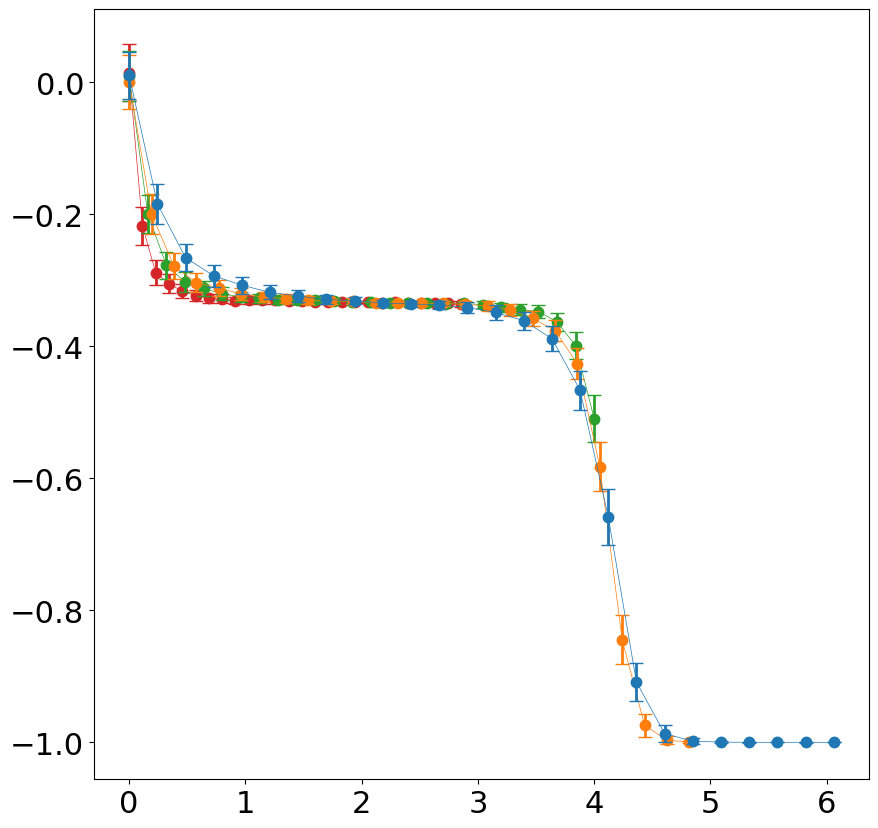

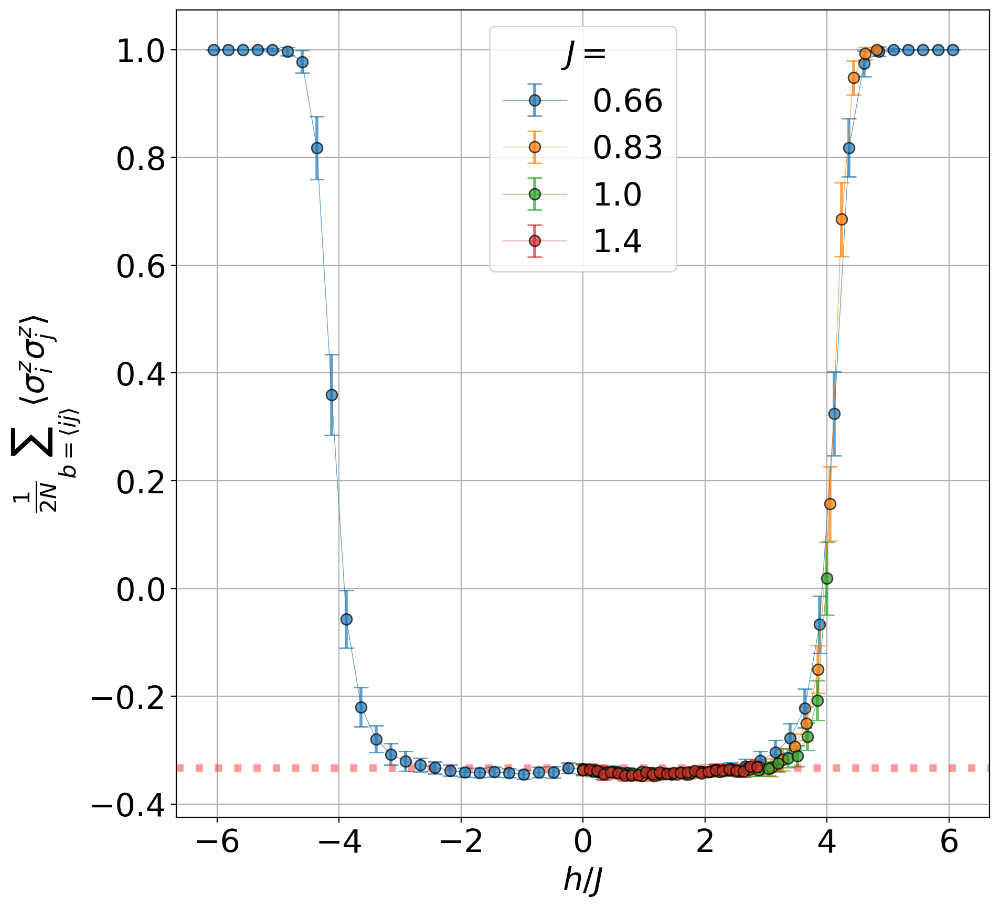

In [22]:
plt.figure(figsize=(10,10), dpi=200)

classE1_list = [classE1_2,classE1_3,classE1_4,classE1_5]

for j in range(len(classE1_list)):
    
    energies = classE1_list[j]
    
    if j==0:
        h1list_plot = np.array(sorted(list(h1list_fwd) + list(-1*h1list_fwd[1:])))
    else:
        h1list_plot = h1list_fwd
    
    jval = jlist_fwd[j]
    
    avgEs=[]
    sdEs=[]
    for i in range(len(energies)):
        avgEs.append(np.mean((energies[i])))
        sdEs.append(np.std(energies[i]))

    plt.errorbar(
        h1list_plot/jval,
        np.array(avgEs),
        sdEs,
        fmt='.-',
        ms=15,
        lw=0.5,
        elinewidth=2,
        capsize=5,
        label= str(jval),
        alpha=0.7,
        markeredgecolor='black'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.xlabel(r'$h/J$')
plt.ylabel(r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $')
plt.grid()
plt.legend(title=r'$J=$')
plt.show()


In [23]:
eclass1list = [classE1_2_sliced,classE1_3,classE1_4,classE1_5]
eclass2list = [classE2_2[25:],  classE2_3,classE2_4,classE2_5]

# rev phase diagram periodic

In [63]:
hlist=np.linspace(0,4,26)
slist=np.linspace(0.25,0.85,31)

In [64]:
folder = list(
    Path(
        '/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /periodic Kagome rev phase diagram/processed'
    ).glob('*'))
for file in folder:
    if str(file).split('/')[-1]!='.DS_Store':
        name=Path(file).stem
        locals()[name]=np.load(file)  
        print(name)

phis
avgbrokens
energies
mags3
mags2
mags1
resps
brokens


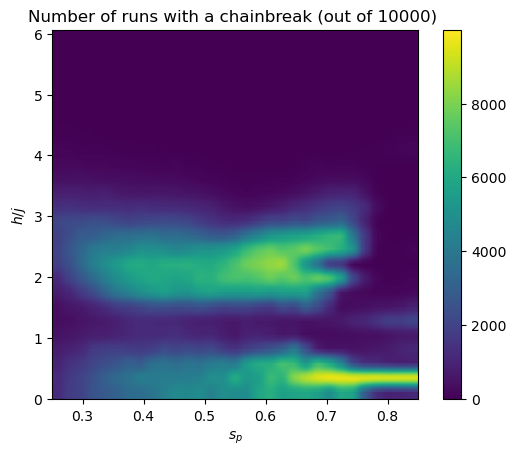

In [159]:
x=slist
y=hlist/0.66

extent = np.min(x), np.max(x), np.min(y), np.max(y)

plt.imshow(brokens, 
           cmap = 'viridis', 
           extent = extent, 
           aspect = 0.1, 
           origin = 'lower',
           interpolation ='hamming')
plt.colorbar()

# Add labels and title
plt.xlabel(r'$s_{p}$')
plt.ylabel(r'$h/j$')
plt.title('Number of runs with a chainbreak (out of 10000) ')

# Show the plot
plt.show()

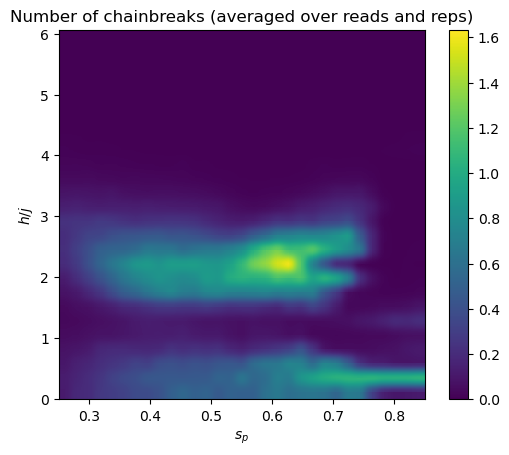

In [161]:
x=slist
y=hlist/0.66

extent = np.min(x), np.max(x), np.min(y), np.max(y)

plt.imshow(np.mean(avgbrokens, axis = 2), 
           cmap = 'viridis', 
           extent = extent, 
           aspect = 0.1, 
           origin = 'lower',
           interpolation='hamming')
plt.colorbar()

# Add labels and title
plt.xlabel(r'$s_{p}$')
plt.ylabel(r'$h/j$')
plt.title('Number of chainbreaks (averaged over reads and reps)')

# Show the plot
plt.show()

In [238]:
avg_ene = []
for i in range(31):
    avg_ene.append(np.sum(energies[0,i,:,100:])/5000)


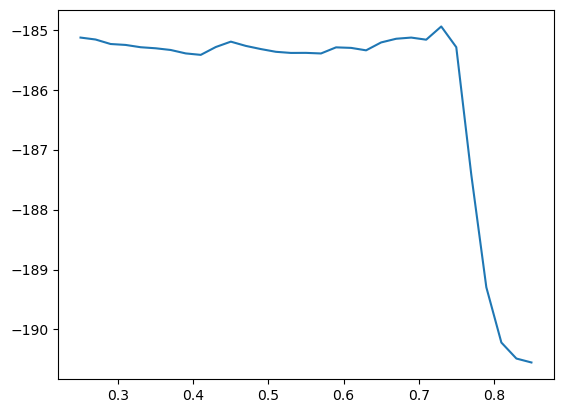

In [239]:
plt.plot(slist, avg_ene)
plt.show()

In [230]:
np.mean(np.mean(energies, axis=2)[:,:,150:],axis=2)

(26, 31, 200)

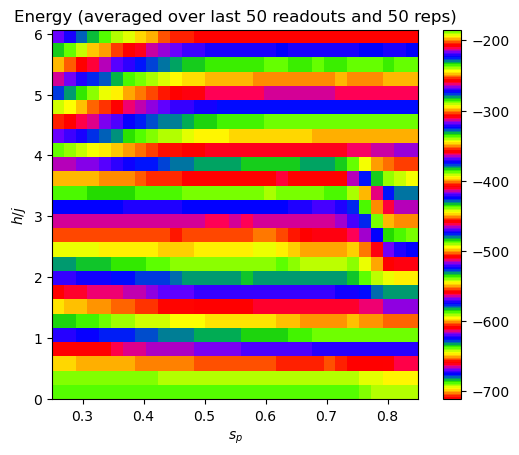

In [237]:
x=slist
y=hlist/0.66

extent = np.min(x), np.max(x), np.min(y), np.max(y)

plt.imshow(np.mean(np.mean(energies, axis=2)[:,:,100:],axis=2), 
           cmap = 'prism', 
           extent = extent, 
           aspect = 0.1,
           origin = 'lower',
#            interpolation = 'hamming'
          )
plt.colorbar()

# Add labels and title
plt.xlabel(r'$s_{p}$')
plt.ylabel(r'$h/j$')
plt.title('Energy (averaged over last 50 readouts and 50 reps)')

# Show the plot
plt.show()

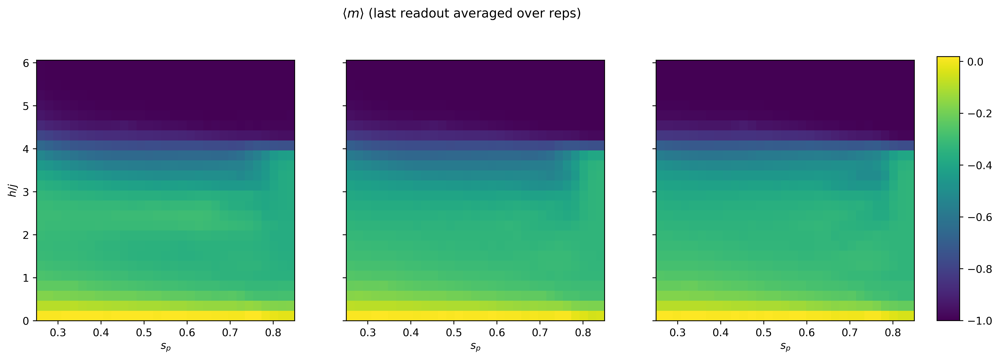

In [205]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=500, sharey=True)
maglist = [mags1, mags2, mags3]

cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Colorbar axes

for j in range(len(maglist)):
    axj = ax[j]

    x = slist
    y = hlist / 0.66

    extent = np.min(x), np.max(x), np.min(y), np.max(y)

    im = axj.imshow(np.mean(np.mean(maglist[j], axis=2)[:,:,150:],axis=2),
                    cmap='viridis',
                    extent=extent,
                    aspect=0.1,
                    origin='lower',
#                     interpolation='hamming'
                   )

# Add a single colorbar
fig.colorbar(im, cax=cax)

for axis in ax.flat:
    xlabel = r'$s_{p}$'
    ylabel = r'$h/j$'
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.label_outer()

fig.suptitle(r'$ \langle m \rangle $' + ' (last readout averaged over reps)')

# Show the plot
plt.show()

# rev anneal run with fixed anneal offsets

In [269]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [287]:
hoverjlist = sorted(list(np.linspace(0.0,4,21)) + [5,6] +[0.1,0.3,0.5 , 3.5,3.7,3.9])
hoverjlist = np.array(hoverjlist)
hoverjlist_ra = hoverjlist
hlist = np.array(hoverjlist) / 1.5120125550062011
slist=np.linspace(0.05,0.85,41)
slist_ra = slist
# slist=np.linspace(0.25,0.85,31)

print(hoverjlist)
print(slist)

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.8 1.  1.2 1.4 1.6 1.8 2.  2.2 2.4 2.6 2.8
 3.  3.2 3.4 3.5 3.6 3.7 3.8 3.9 4.  5.  6. ]
[0.05 0.07 0.09 0.11 0.13 0.15 0.17 0.19 0.21 0.23 0.25 0.27 0.29 0.31
 0.33 0.35 0.37 0.39 0.41 0.43 0.45 0.47 0.49 0.51 0.53 0.55 0.57 0.59
 0.61 0.63 0.65 0.67 0.69 0.71 0.73 0.75 0.77 0.79 0.81 0.83 0.85]


In [271]:
energies_gamma0 = []
mags_gamma0 = []
eclass1_gamma0 = []
eclass2_gamma0 =[]
for i in range(len(hoverjlist)):
    hoverj=hoverjlist[i]
    ind=find_nearest(hoverjlist_fwd.flatten(),hoverj)
    if hoverj == 0.0:
        indices = (np.array([2]),np.array([0]))
    else:
        indices = np.where(hoverjlist_fwd==hoverjlist_fwd.flatten()[ind])
    energies_gamma0.append(np.mean(energies_list[indices[0][0]][indices[1][0]]))
    mags_gamma0.append(np.mean(mags_biglist[indices[0][0]][2][indices[1][0]]))
    eclass1_gamma0.append(np.mean(eclass1list[indices[0][0]][indices[1][0]]))
    eclass2_gamma0.append(np.mean(eclass2list[indices[0][0]][indices[1][0]]))

In [272]:
slist_indices = []
for i in range(len(slist)):
    slist_indices.append(find_nearest(new_s,slist[i]))
AoverB = np.divide(new_A,new_B)
gammalist = AoverB[slist_indices]

In [273]:
processed_folder = "/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /periodic Kagome final reverse anneal phase diagram/processed2"

In [274]:
ener_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class1_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class2_arr=np.zeros(shape=(len(hlist),2,len(slist)))
# all_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
# downtri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
gooddowntri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
broken_arr=np.zeros(shape=(len(hlist),2,len(slist)))


for i in range(len(hlist)):
    hplot=hlist[i]
    
    for j in range(len(slist)):
        splot=slist[j]
        
        name_file = processed_folder + "/h1={}_s={}_processed.hdf5".format(hplot, round(splot,2))
        data = h5py.File(name_file, 'r')

        
        
        ener_arr[i][0][j] = np.mean(np.array(data['energies'])[:,100:])
        ener_arr[i][1][j] = np.std(np.array(data['energies'])[:,100:])
        
        ener_class1_arr[i][0][j] = np.mean(np.array(data['classical_energy1'])[:,100:])
        ener_class1_arr[i][1][j] = np.std(np.array(data['classical_energy1'])[:,100:])
        
        ener_class2_arr[i][0][j] = np.mean(np.array(data['classical_energy2'])[:,100:])
        ener_class2_arr[i][1][j] = np.std(np.array(data['classical_energy2'])[:,100:])
        
#         all_mag_arr[i][0][j] = np.mean(np.array(data['all_magnetization'])[:,100:])
#         all_mag_arr[i][1][j] = np.std(np.array(data['all_magnetization'])[:,100:])
        
#         downtri_mag_arr[i][0][j] = np.mean(np.array(data['down_triangle_magnetization'])[:,100:])
#         downtri_mag_arr[i][1][j] = np.std(np.array(data['down_triangle_magnetization'])[:,100:])
        
        gooddowntri_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])[:,100:])
        gooddowntri_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])[:,100:])
        
        broken_arr[i][0][j] = np.mean(np.array(data['avg_broken']))
        broken_arr[i][1][j] = np.std(np.array(data['avg_broken']))

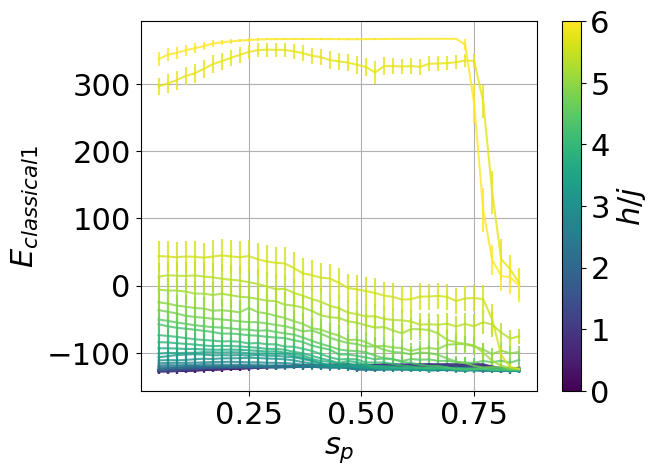

In [275]:
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class1_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        slist, ener_class1_arr[i][0],
        yerr = ener_class1_arr[i][1],
        label = round(hoverj, 1),
        c = plt.cm.viridis(colors[i]),
        alpha = 0.8,
    )
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ E_{classical1} $')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


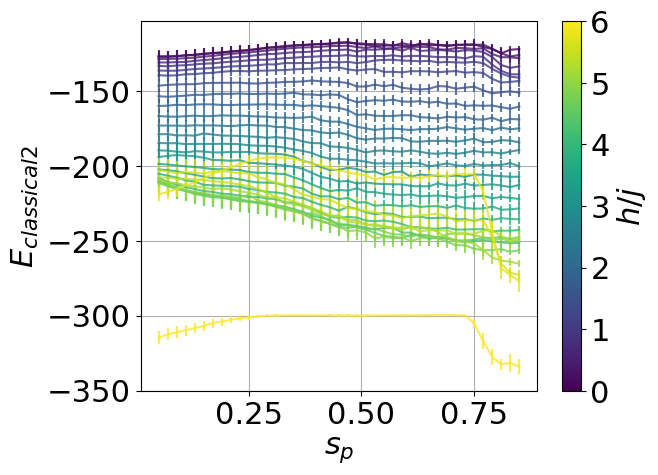

In [276]:
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class2_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        slist, ener_class2_arr[i][0],
        yerr=ener_class2_arr[i][1],
        label=round(hoverj, 1),
        c=plt.cm.viridis(colors[i]),
        alpha=0.8,
    )
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ E_{classical2} $')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


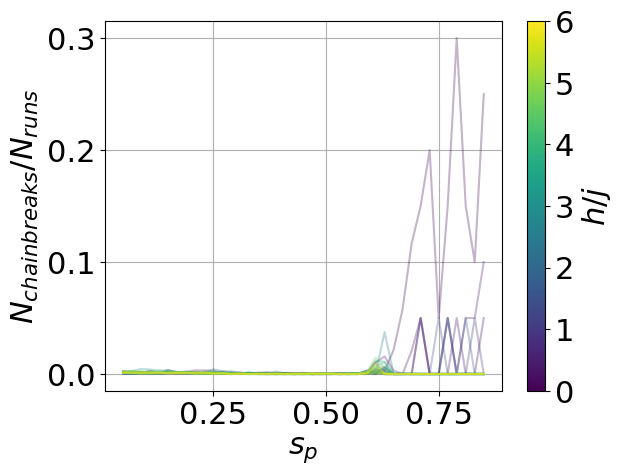

In [277]:
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(broken_arr)):
    hoverj = hoverjlist[i]
    plt.plot(
        slist, broken_arr[i][0],
#         yerr=broken_arr[i][1],
        label=round(hoverj, 1),
        c=plt.cm.viridis(colors[i]),
        alpha=0.3
    )
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ N_{chainbreaks}/N_{runs} $')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


In [278]:
magarr.shape

(19, 2, 11)

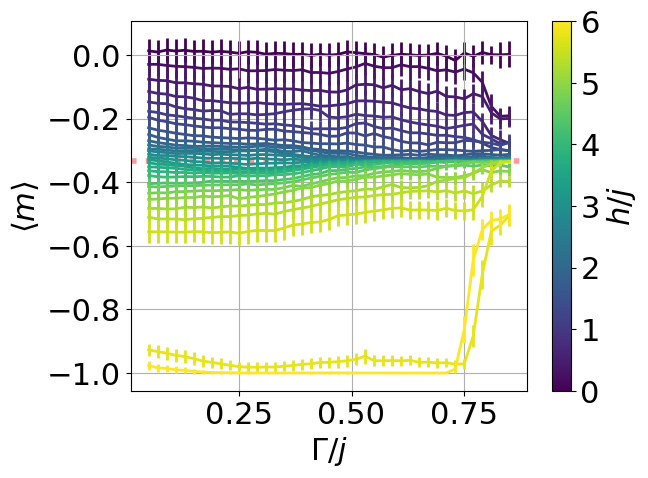

In [303]:
magarr = gooddowntri_mag_arr

colors = np.linspace(0, 1, len(hoverjlist))
# colors = np.linspace(0, 1, 7)

for i in range(len(magarr)):
# for i in range(7,13):
    hoverj = hoverjlist[i]
    plt.errorbar(
#         gammalist*1.512012555006201,
        slist,
        magarr[i][0],
        yerr=magarr[i][1],
        label=round(hoverj, 1),
        c=plt.cm.viridis(colors[i]),
        zorder = i,
        lw=2,
#         fmt='-.'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=4, zorder=0)
plt.grid()
plt.xlabel(r'$ \Gamma /j $')
plt.ylabel(r'$ \langle m \rangle $')
# plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(hoverjlist)
# sm.set_array(hoverjlist[7:13])
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


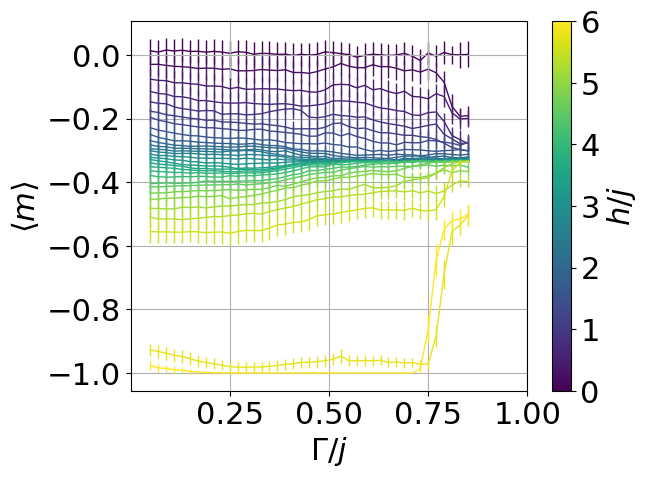

In [280]:
magarr = gooddowntri_mag_arr
magarr_ra = magarr

ncurves = len(magarr)
initial_curve = 0
# ncurves = 12
colors = np.linspace(0, 1, ncurves)
# colors = np.linspace(0, 1, 7)
plot_h_val = []
for i in range(initial_curve, initial_curve + ncurves):
# for i in range(7,13):
    hoverj = hoverjlist[i]
    plot_h_val.append(hoverj)
    plt.errorbar(
#         gammalist*1.512012555006201, 
        slist,
        magarr[i][0] - 0*mags_gamma0[i],
        yerr=magarr[i][1],
        label=round(hoverj, 1),
        c=plt.cm.viridis(colors[i - initial_curve]),
        zorder = i,
        lw=1
    )
    
# plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=4, zorder=i+1)
plt.grid()
plt.xlabel(r'$ \Gamma /j $')
plt.ylabel(r'$ \langle m \rangle $')
# plt.xscale('log')
plt.xlim((0.0001,1))

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(plot_h_val)
# sm.set_array(hoverjlist[7:13])
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


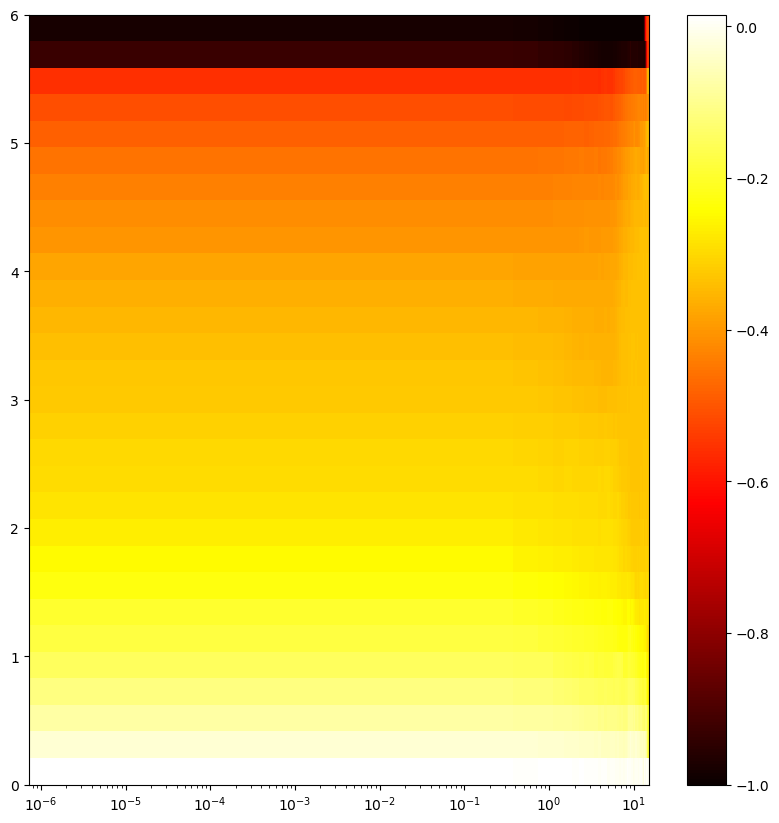

In [375]:
x=gammalist*1.512012555006201
# x=slist
y=hoverjlist
z=magarr[:,0,:]

extent=(x.min(), x.max(), y.min(), y.max())

plt.figure(dpi=100, figsize = (10,10))

plt.imshow(
    z,
    aspect = 'auto',
    origin = 'lower',
    extent = extent,
    cmap = 'hot',
#     interpolation = 'nearest'
)

plt.xscale('log')
# plt.xticks(ticks=x,labels=x,fontsize=1)
plt.colorbar()
plt.show()

# slice of the same 5 h values from phase diagram run

In [421]:
processed_folder = "/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /periodic Kagome reverse anneal test 3/processed"

In [422]:
ener_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
downtri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
gooddowntri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
broken_arr=np.zeros(shape=(len(hlist),2,len(slist)))


for i in range(len(hlist)):
    hplot=hlist[i]
    
    for j in range(len(slist)):
        splot=slist[j]
        
        name_file = processed_folder + "/h1={}_s={}_processed.hdf5".format(hplot, splot)
        data = h5py.File(name_file, 'r')
        
        
        ener_arr[i][0][j] = np.mean(np.array(data['energies'])[:,100:])
        ener_arr[i][1][j] = np.std(np.array(data['energies'])[:,100:])
        
        all_mag_arr[i][0][j] = np.mean(np.array(data['all_magnetization'])[:,100:])
        all_mag_arr[i][1][j] = np.std(np.array(data['all_magnetization'])[:,100:])
        
        downtri_mag_arr[i][0][j] = np.mean(np.array(data['down_triangle_magnetization'])[:,100:])
        downtri_mag_arr[i][1][j] = np.std(np.array(data['down_triangle_magnetization'])[:,100:])
        
        gooddowntri_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])[:,100:])
        gooddowntri_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])[:,100:])
        
        broken_arr[i][0][j] = np.mean(np.array(data['avg_broken']))
        broken_arr[i][1][j] = np.std(np.array(data['avg_broken']))

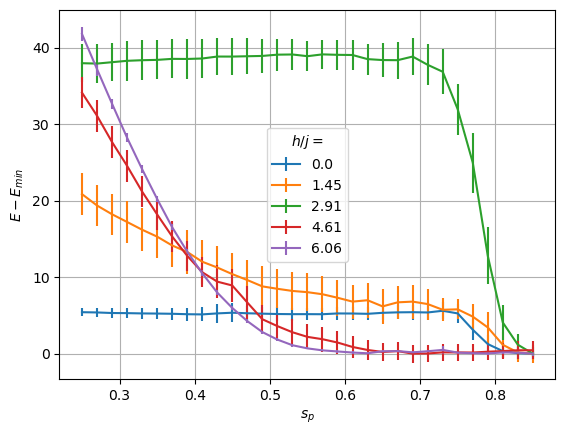

In [423]:
for i in range(len(ener_arr)):
    h=hlist[i]
    plt.errorbar(
        x=slist, y=ener_arr[i][0]-np.min(ener_arr[i][0]), 
        yerr=ener_arr[i][1],
        label = round(h/0.66,2)
    )
plt.grid()
plt.legend(title=r'$ h/j= $')
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ E-E_{min} $')
plt.show()

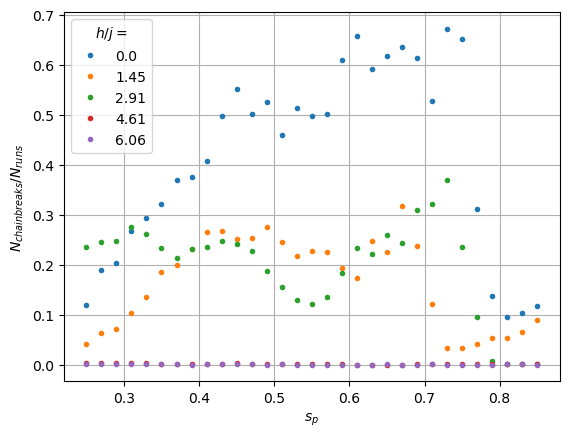

In [424]:
for i in range(len(broken_arr)):
    h=hlist[i]
    plt.errorbar(
        x=slist, y=broken_arr[i][0], 
#         yerr=broken_arr[i][1],
        fmt='.',
        label = round(h/0.66,2)
    )
plt.grid()
plt.legend(title=r'$ h/j= $')
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ N_{chainbreaks}/N_{runs} $')
plt.show()

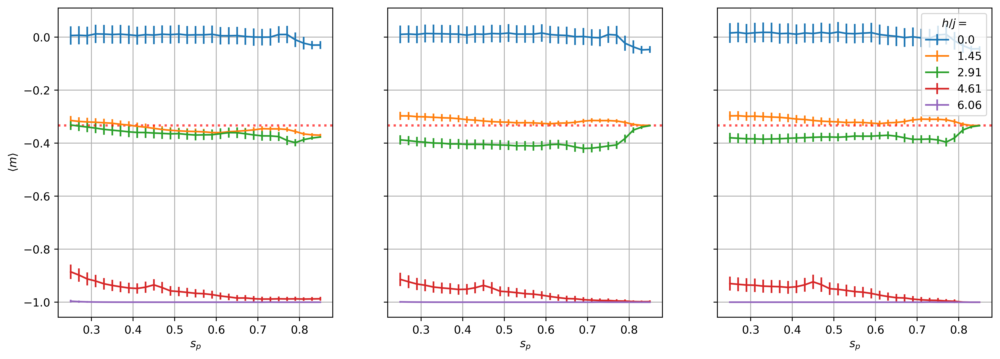

In [425]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), dpi=500, sharey=True)
mags=[all_mag_arr,downtri_mag_arr,gooddowntri_mag_arr]

for j in range(len(mags)):
    magarr=mags[j]
    axj=ax[j]
    for i in range(len(magarr)):
        h=hlist[i]
        axj.errorbar(
            x=slist, y=magarr[i][0],
            yerr=magarr[i][1],
            label = round(h/0.66,2)
        )
        axj.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.2, lw=2) 


for axis in ax.flat:
    axis.grid()
    xlabel = r'$ s_p $'
    ylabel = r'$ \langle m \rangle $'
    axis.set(xlabel=xlabel, ylabel=ylabel)
    axis.label_outer()
    
plt.legend(title=r'$ h/j= $')
plt.show()


# APQ1

In [321]:
slist=np.linspace(0.2,0.7,11)
slist_apq = slist
hoverjlist = sorted([
    0, 0.25, 0.5, 1.0, 1.5, 
    2.0, 2.5, 3.0, 3.5, 3.7, 
    3.9, 4.1, 4.5, 5.2, 6])

hlist = list(hoverjlist / np.max(J22_s))
hlist_addon = list(np.array([1.25, 1.75, 2.25, 2.75]) * np.max(J22_s))
hlist = sorted(hlist + hlist_addon)

hoverjlist = np.array(hlist) * np.max(J22_s)
hoverjlist_apq = hoverjlist

print(hoverjlist)
print(hlist)

[0.         0.25       0.5        1.         1.5        2.
 2.5        2.85772746 3.         3.5        3.7        3.9
 4.00081844 4.1        4.5        5.14390942 5.2        6.
 6.28700041]
[0.0, 0.16534254240962615, 0.3306850848192523, 0.6613701696385046, 0.9920552544577569, 1.3227403392770092, 1.6534254240962616, 1.8900156937577515, 1.9841105089155138, 2.314795593734766, 2.4470696276624673, 2.5793436615901677, 2.646021971260852, 2.7116176955178686, 2.9761657633732708, 3.4020282487639526, 3.439124882120224, 3.9682210178310275, 4.158034526267053]


In [408]:
cvals  = [0., 2.0, 4.0, 6.287]
colors = ["blue","red","yellow", "green"]
norm=plt.Normalize(min(cvals),max(cvals))
tuples = list(zip(map(norm,cvals), colors))
cmap = mc.LinearSegmentedColormap.from_list("", tuples)


In [323]:
energies_gamma0 = []
mags_gamma0 = []
eclass1_gamma0 = []
eclass2_gamma0 =[]
for i in range(len(hoverjlist)):
    hoverj=hoverjlist[i]
    ind=find_nearest(hoverjlist_fwd.flatten(),hoverj)
    if hoverj == 0.0:
        indices = (np.array([2]),np.array([0]))
    else:
        indices = np.where(hoverjlist_fwd==hoverjlist_fwd.flatten()[ind])
    energies_gamma0.append(np.mean(energies_list[indices[0][0]][indices[1][0]]))
    mags_gamma0.append(np.mean(mags_biglist[indices[0][0]][2][indices[1][0]]))
    eclass1_gamma0.append(np.mean(eclass1list[indices[0][0]][indices[1][0]]))
    eclass2_gamma0.append(np.mean(eclass2list[indices[0][0]][indices[1][0]]))

In [324]:
slist_indices = []
for i in range(len(slist)):
    slist_indices.append(find_nearest(new_s,slist[i]))
AoverB = np.divide(new_A,new_B)
gammalist = AoverB[slist_indices]


In [325]:
processed_folder = "/Users/prathunarasimhan/Desktop/APQ final processed 2"

In [354]:
ener_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class1_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class2_arr=np.zeros(shape=(len(hlist),2,len(slist)))

gooddowntri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
good_down_tri_mag_sq_arr=np.zeros(shape=(len(hlist),2,len(slist)))
good_down_tri_mag_fo_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_sites_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_down_triangle_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_onechains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_twochains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_down_tri_onechains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
all_down_tri_twochains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
good_down_tri_onechains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
good_down_tri_twochains_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))

broken_arr=np.zeros(shape=(len(hlist),2,len(slist)))

phi_arr=np.zeros(shape=(len(hlist),2,len(slist)))
phi_angle_arr=np.zeros(shape=(len(hlist),2,len(slist)))

Mval_arr=np.zeros(shape=(len(hlist),2,len(slist)))
Kval_arr=np.zeros(shape=(len(hlist),2,len(slist)))


for i in range(len(hlist)):
    hplot=hlist[i]
    
    for j in range(len(slist)):
        splot=slist[j]
        
        name_file = processed_folder + "/h1={}_s={}_processed.hdf5".format(hplot, round(splot,2))
        data = h5py.File(name_file, 'r')

        
        
        ener_arr[i][0][j] = np.mean(np.array(data['energies']))
        ener_arr[i][1][j] = np.std(np.array(data['energies']))
        
        ener_class1_arr[i][0][j] = np.mean(np.array(data['energy_classical1']))
        ener_class1_arr[i][1][j] = np.std(np.array(data['energy_classical1']))
        
        ener_class2_arr[i][0][j] = np.mean(np.array(data['energy_classical2']))
        ener_class2_arr[i][1][j] = np.std(np.array(data['energy_classical2']))
        
    
        
        gooddowntri_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization']))
        gooddowntri_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization']))
        
#         good_down_tri_mag_sq_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization_sq']))
#         good_down_tri_mag_sq_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization_sq']))
        good_down_tri_mag_sq_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])**2)
        good_down_tri_mag_sq_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])**2)
        
#         good_down_tri_mag_fo_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization_fo']))
#         good_down_tri_mag_fo_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization_fo']))
        good_down_tri_mag_fo_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])**4)
        good_down_tri_mag_fo_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])**4)
        
        all_sites_mag_arr[i][0][j] = np.mean(np.array(data['all_sites_magnetization']))
        all_sites_mag_arr[i][1][j] = np.std(np.array(data['all_sites_magnetization']))
        
        all_down_triangle_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_magnetization']))
        all_down_triangle_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_magnetization']))
        
        all_onechains_mag_arr[i][0][j] = np.mean(np.array(data['all_onechains_magnetization']))
        all_onechains_mag_arr[i][1][j] = np.std(np.array(data['all_onechains_magnetization']))
        
        all_twochains_mag_arr[i][0][j] = np.mean(np.array(data['all_twochains_magnetization']))
        all_twochains_mag_arr[i][1][j] = np.std(np.array(data['all_twochains_magnetization']))
        
        all_down_tri_onechains_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_onechains_magnetization']))
        all_down_tri_onechains_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_onechains_magnetization']))
        
        all_down_tri_twochains_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_twochains_magnetization']))
        all_down_tri_twochains_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_twochains_magnetization']))
        
        good_down_tri_onechains_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_onechains_magnetization']))
        good_down_tri_onechains_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_onechains_magnetization']))
        
        good_down_tri_twochains_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_twochains_magnetization']))
        good_down_tri_twochains_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_twochains_magnetization']))
        
        
        
        broken_arr[i][0][j] = np.mean(np.array(data['avg_broken']))
        broken_arr[i][1][j] = np.std(np.array(data['avg_broken']))
        
        phi_arr[i][0][j]=np.mean(np.abs(np.array(data['phis'])))/3
        phi_arr[i][1][j]=np.std(np.abs(np.array(data['phis'])))/3
        
        phi_angle_arr[i][0][j]=np.mean(np.angle(np.array(data['phis'])))
        
        Mval_arr[i][0][j] = np.mean(np.array(data['Mvals']))
        Mval_arr[i][1][j] = np.std(np.array(data['Mvals']))
        
        Kval_arr[i][0][j] = np.mean(np.array(data['Kvals']))
        Kval_arr[i][1][j] = np.std(np.array(data['Kvals']))    

In [ ]:
# gooddowntri_mag_arr
# good_down_tri_mag_sq_arr
# good_down_tri_mag_fo_arr
# all_sites_mag_arr
# all_down_triangle_mag_arr
# all_onechains_mag_arr
# all_twochains_mag_arr
# all_down_tri_onechains_mag_arr
# all_down_tri_twochains_mag_arr
# good_down_tri_onechains_mag_arr
# good_down_tri_twochains_mag_arr

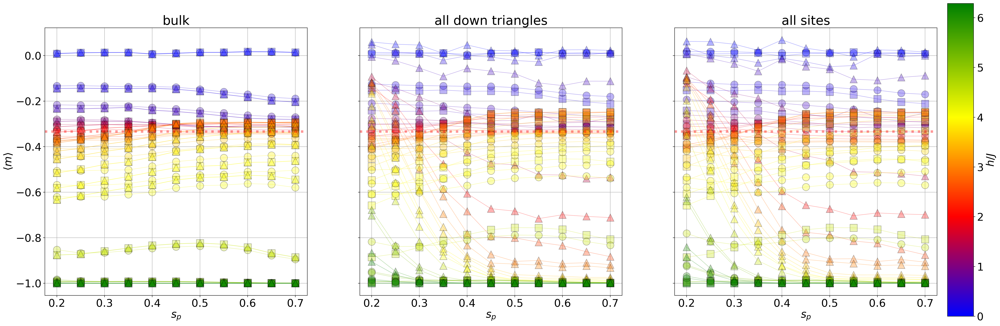

In [577]:
fig, ax = plt.subplots(1,3, figsize=(30,10), dpi=200, sharey=True, )

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(hoverjlist)):
    hoverj = hoverjlist[i]
    x=slist
    
    lw=1
    ms=15
    mec='black'
    alpha = 0.3
    labels = ['onechains and twochains', 'onechains', 'twochains']
    
    ax[0].set(title = 'bulk', ylabel=r'$ \langle m \rangle $')
    ax[0].plot(
        x,
        gooddowntri_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[0].plot(
        x,
        good_down_tri_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[0].plot(
        x,
        good_down_tri_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
    ax[1].set(title = 'all down triangles')
    ax[1].plot(
        x,
        all_down_triangle_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[1].plot(
        x,
        all_down_tri_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[1].plot(
        x,
        all_down_tri_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
    ax[2].set(title = 'all sites')
    ax[2].plot(
        x,
        all_sites_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[2].plot(
        x,
        all_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[2].plot(
        x,
        all_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
        

for axis in ax.flat:
#     axis.set_xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
    axis.set_xlabel(r'$ s_p $')
#     axis.set_xscale('log')
    axis.grid()
    axis.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)


# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)

fig.subplots_adjust(right=0.98)
cbar_ax = fig.add_axes([0.99, 0.05, 0.025, 0.9])
fig.colorbar(sm, label=r'$ h/J $', cax=cbar_ax)




plt.show()

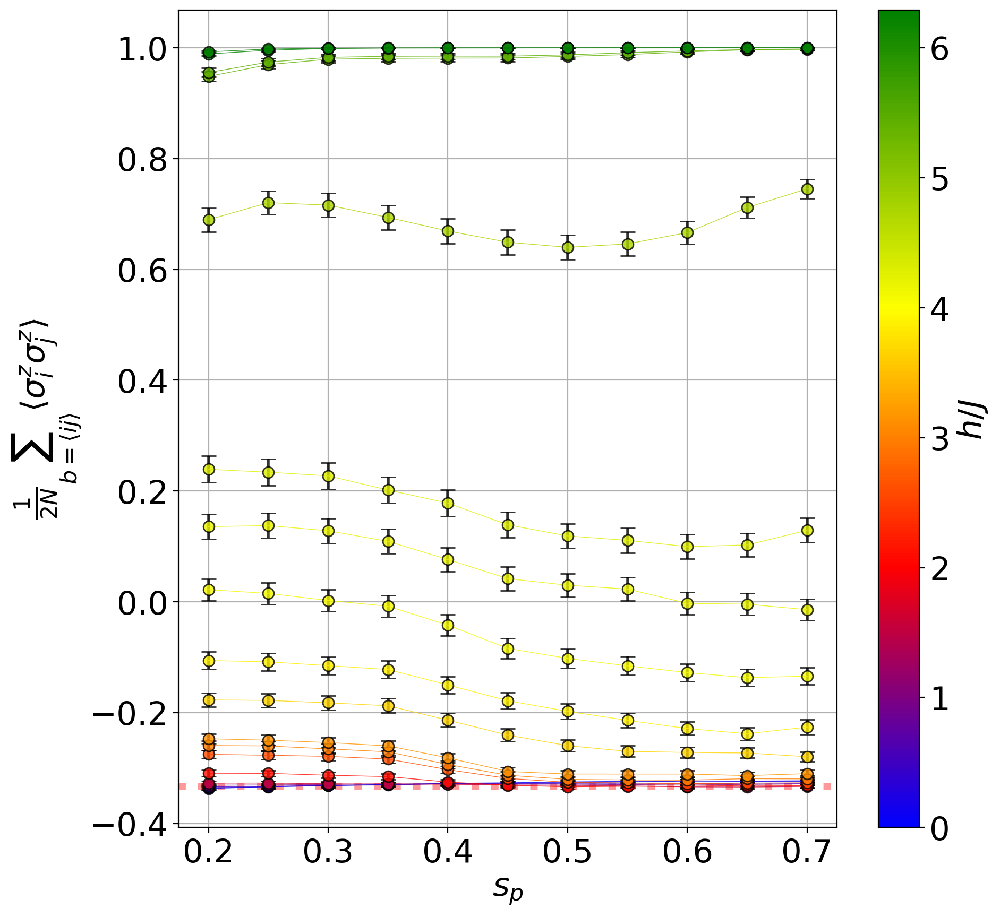

In [563]:
plt.figure(figsize=(10,10), dpi=200)
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class1_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        slist, 
        ener_class1_arr[i][0],
        yerr = ener_class1_arr[i][1]/3,
        label = round(hoverj, 1),
        c = cmap(hoverjlist[i]/6),
        alpha = 0.8,
        markersize=15,
        markeredgecolor='black',
        capsize=5,
        elinewidth=2,
        ecolor='black',
        lw=0.5,
        fmt='.-'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $')
# plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


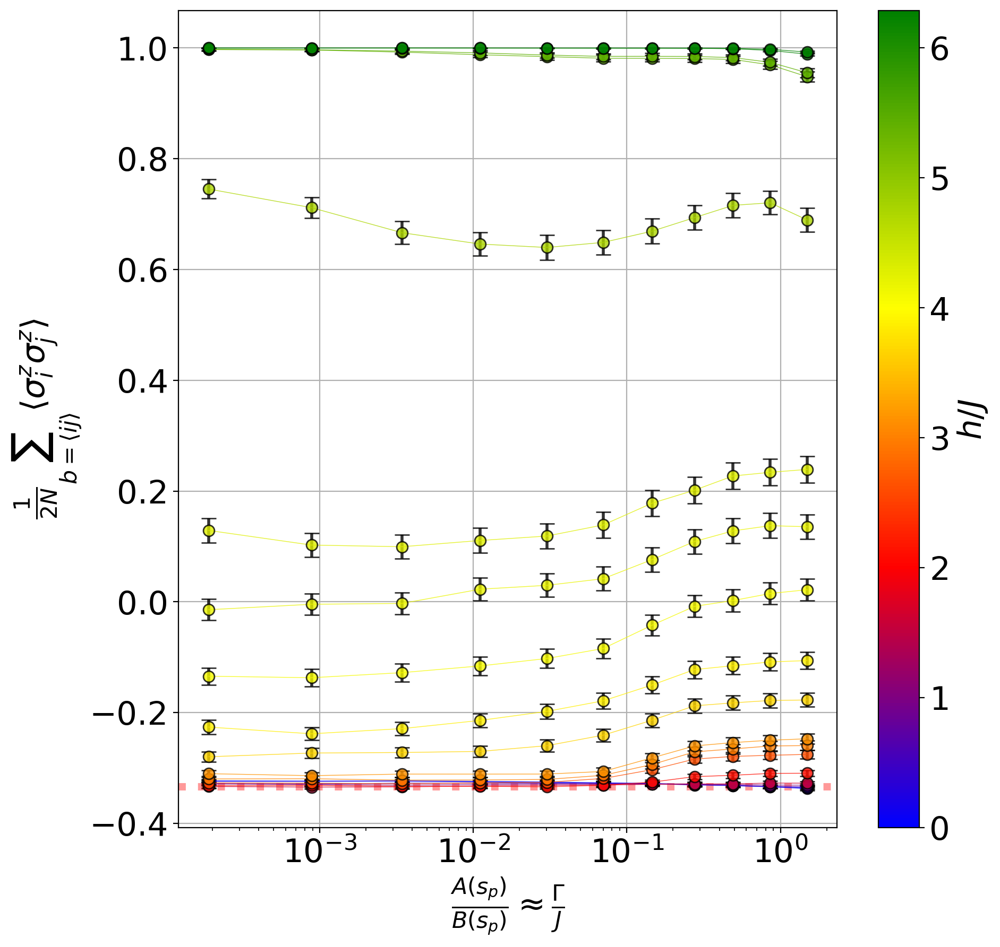

In [565]:
plt.figure(figsize=(10,10), dpi=200)
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class1_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        gammalist, 
        ener_class1_arr[i][0],
        yerr = ener_class1_arr[i][1]/3,
        label = round(hoverj, 1),
        c = cmap(hoverjlist[i]/6),
        alpha = 0.8,
        markersize=15,
        markeredgecolor='black',
        capsize=5,
        elinewidth=2,
        ecolor='black',
        lw=0.5,
        fmt='.-'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.grid()
plt.xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
plt.ylabel(r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $')
plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


In [234]:
# colors = np.linspace(0, 1, len(hoverjlist))

# for i in range(len(ener_class2_arr)):
#     hoverj = hoverjlist[i]
#     plt.errorbar(
#         slist, 
#         ener_class2_arr[i][0],
#         yerr=ener_class2_arr[i][1],
#         label=round(hoverj, 1),
#         c=plt.cm.viridis(colors[i]),
#         alpha=0.8,
#     )
# plt.grid()
# plt.xlabel(r'$ s_p $')
# plt.ylabel(r'$ E_{classical2} $')

# # Create a colorbar
# sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
# sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
# plt.colorbar(sm, label=r'$ h/j $')

# plt.show()


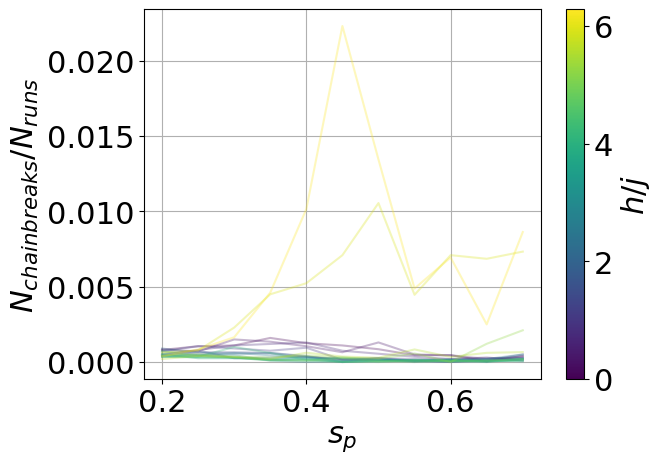

In [235]:
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(broken_arr)):
    hoverj = hoverjlist[i]
    plt.plot(
        slist, broken_arr[i][0],
#         yerr=broken_arr[i][1],
        label=round(hoverj, 1),
        c=plt.cm.viridis(colors[i]),
        alpha=0.3
    )
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ N_{chainbreaks}/N_{runs} $')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/j $')

plt.show()


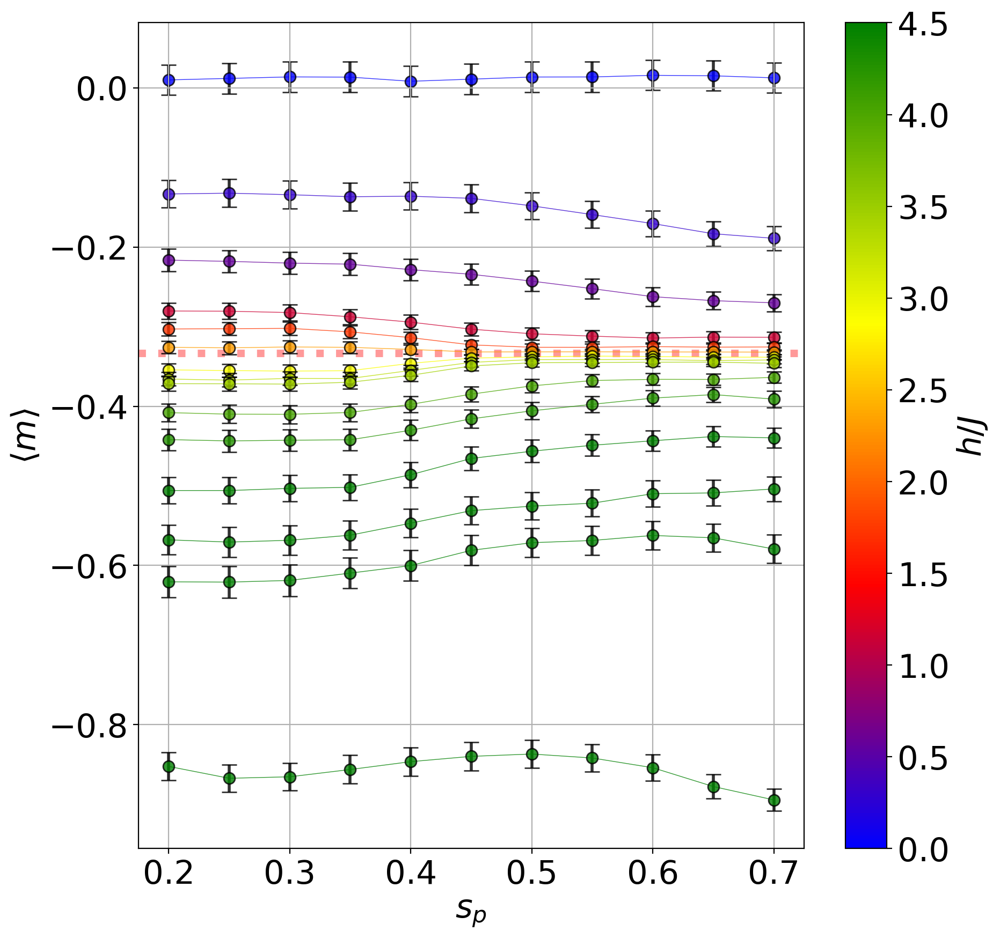

In [566]:
plt.figure(figsize=(10,10), dpi=200)
magarr = gooddowntri_mag_arr

colors = np.linspace(0, 1, len(hoverjlist[:-4]))

for i in range(len(magarr[:-4])):
    hoverj = hoverjlist[i]
    
    x=slist
    y=magarr[i][0] - 0*mags_gamma0[i]
    
    error=np.std(y)

    
    plt.errorbar(
        x,
        y,
        yerr=magarr[i][1]/2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[:-4][i]/3.9),
        zorder = i,
        ms=15,
        lw=0.5,
        fmt='.-',
        capsize=5,
        alpha=0.8,
        ecolor='black',
        markeredgecolor='black',
        elinewidth=2
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots    
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ \langle m \rangle $')
# plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist[:-4])
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


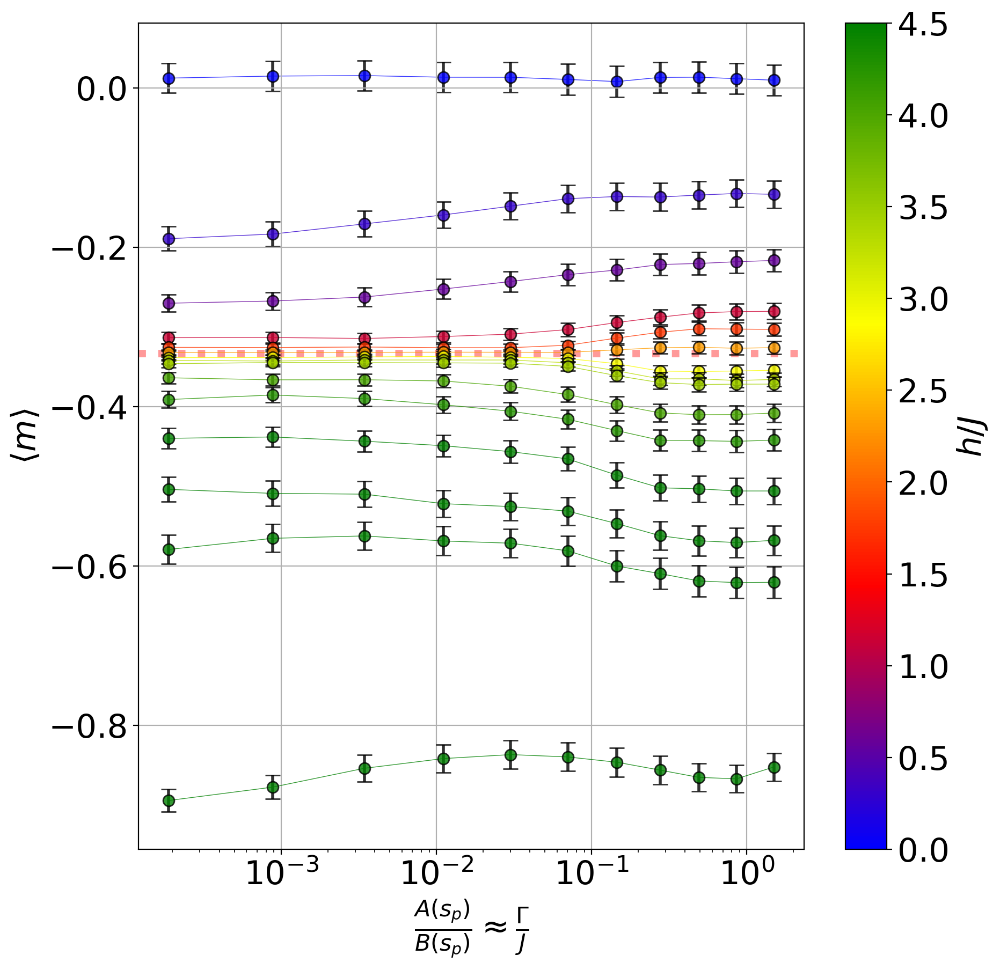

In [423]:
plt.figure(figsize=(10,10), dpi=200)
magarr = gooddowntri_mag_arr
magarr_apq = magarr

colors = np.linspace(0, 1, len(hoverjlist[:-4]))

for i in range(len(magarr[:-4])):
    hoverj = hoverjlist[i]
    
    x=gammalist
    y=magarr[i][0] - 0*mags_gamma0[i]
    
    error=np.std(y)
    
    plt.errorbar(
        x,
        y,
        yerr=magarr[i][1]/2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[:-4][i]/3.9),
#         vmin=0, vmax=4,
        zorder = i,
        ms=15,
        lw=0.5,
        fmt='.-',
        capsize=5,
        alpha=0.8,
        ecolor='black',
        markeredgecolor='black',
        elinewidth=2
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots        
plt.grid()
plt.xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
plt.ylabel(r'$ \langle m \rangle $')
plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist[:-4])
plt.colorbar(sm, label=r'$ h/J $')


plt.show()


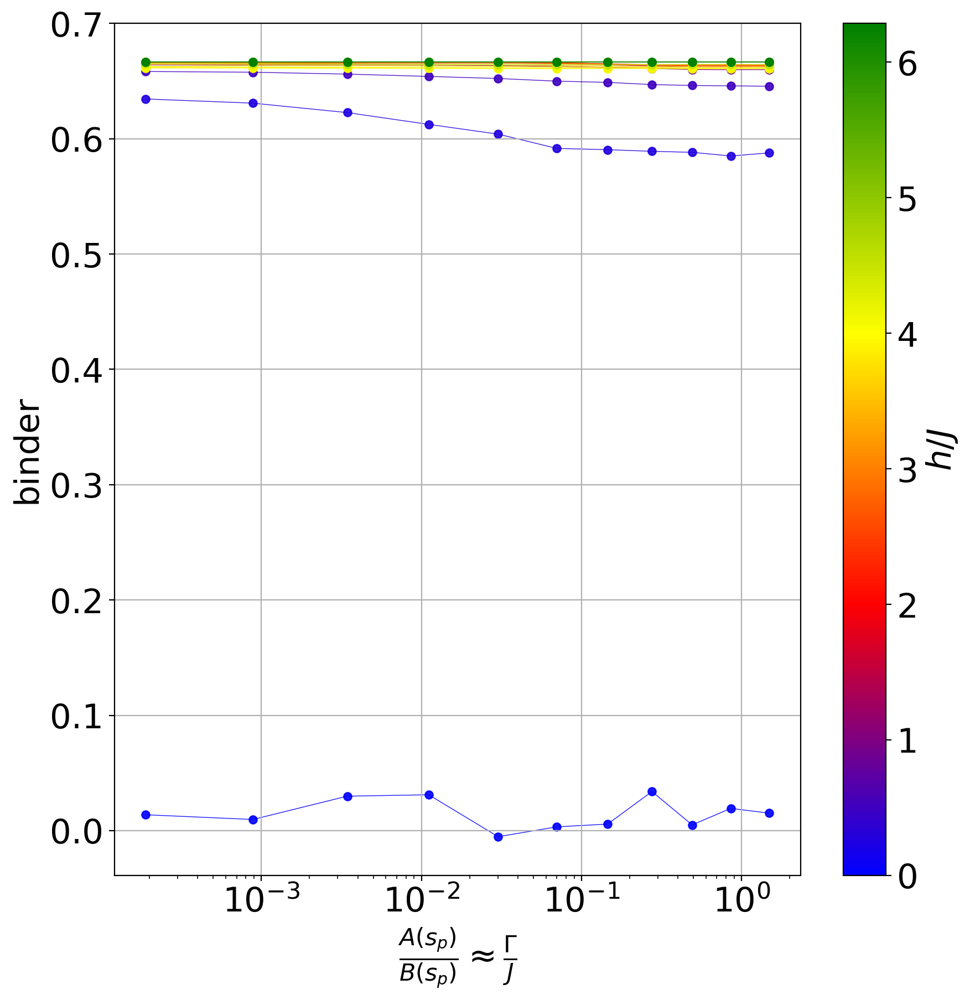

In [413]:
plt.figure(figsize=(10,10), dpi=200)

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(hoverjlist)):
    hoverj = hoverjlist[i]
    
    x=gammalist
    binder = 1 - ((good_down_tri_mag_fo_arr[i][0]) / (3 * ((good_down_tri_mag_sq_arr[i][0])** 2)))
        
    plt.plot(
        x,
        binder,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/6.28),
        zorder = i,
        marker = 'o',
        ms=5,
        lw=0.5,
        alpha=0.9,
#         markeredgecolor='black',
    )
    
# plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots        
plt.grid()
plt.xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
plt.ylabel('binder')
plt.xscale('log')
# plt.ylim([0.6,0.69])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)

plt.colorbar(sm, label=r'$ h/J $')


plt.show()

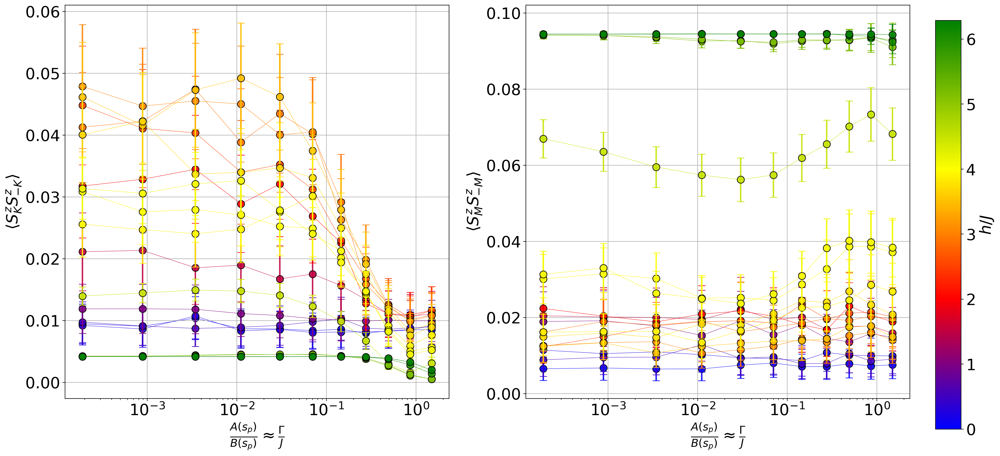

In [431]:
fig, ax = plt.subplots(1,2, figsize=(20,10), dpi=200)

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(hoverjlist)):
    hoverj = hoverjlist[i]
    
    x=gammalist
    y1=Kval_arr[i][0]
    yerr1=Kval_arr[i][1]/3
    y2=Mval_arr[i][0]
    yerr2=Mval_arr[i][1]/3
    
    elc='black'
    mec='black'
    elw=2
    ms=10
    cs=5
    
    ax[0].errorbar(
        x,
        y1,
        yerr=yerr1,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        marker = 'o',
        lw=0.5,
        alpha=0.9,
        markeredgecolor=mec,
        elinewidth=elw,
        ms=ms,
        capsize=cs
    )
    ax[0].set_ylabel(r'$ \langle S_K^z S_{-K}^z \rangle $')
    ax[1].errorbar(
        x,
        y2,
        yerr=yerr2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        marker = 'o',
        lw=0.5,
        alpha=0.9,
        markeredgecolor=mec,
        elinewidth=elw,
        ms=ms,
        capsize=cs
        
    )
    ax[1].set_ylabel(r'$ \langle S_M^z S_{-M}^z \rangle $')

for axis in ax.flat:
    axis.set_xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
    axis.set_xscale('log')
    axis.grid()


# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.975, 0.05, 0.025, 0.8])
fig.colorbar(sm, label=r'$ h/J $', cax=cbar_ax)


plt.show()

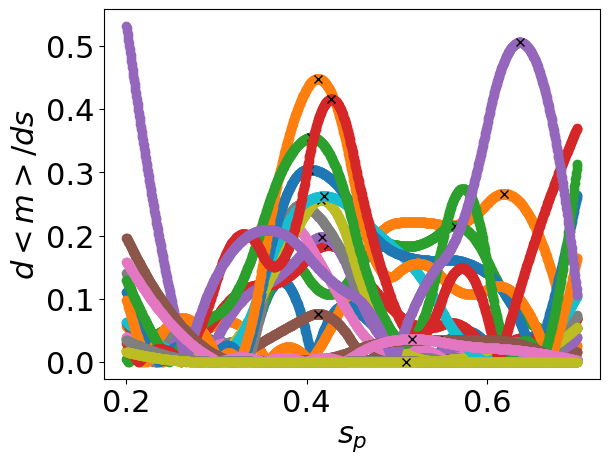

In [532]:
from scipy.interpolate import splrep, BSpline, splev
from scipy.signal import find_peaks

max_deriv_slocations_apq = []

for i in range(len(magarr_apq)):
    hoverj = hoverjlist_apq[i]
    yval = magarr_apq[i][0]
    
    tck = splrep(slist_apq, yval, s=0)
    xnew = np.linspace(0.2, 0.7, 100*len(slist_apq))
    ynew = splev(xnew, tck, der=0)
    ydiff = abs(np.gradient(ynew, xnew[1] - xnew[0]))
    plt.plot(xnew, ydiff, marker = 'o', label = ' h/J={}'.format(hoverj) )
    peaks, _ = find_peaks(ydiff, distance=30)
#     print(xnew[peaks],ydiff[peaks])
#     plt.plot(xnew[peaks], ydiff[peaks], "x", color = 'black')
    plt.plot(xnew[peaks][np.argmax(ydiff[peaks])], np.max(ydiff[peaks]), "x", color = 'black')
    if len(xnew[peaks]) == 0:
        max_deriv_slocations_apq.append(float('NaN'))
    elif np.max(ydiff[peaks]) > 0.025:
        max_deriv_slocations_apq.append( xnew[peaks][np.argmax(ydiff[peaks])] )
    else:
        max_deriv_slocations_apq.append(float('NaN'))

plt.xlabel(r'$s_p$')
plt.ylabel(r'$d<m>/ds$')
# plt.legend()
plt.show()

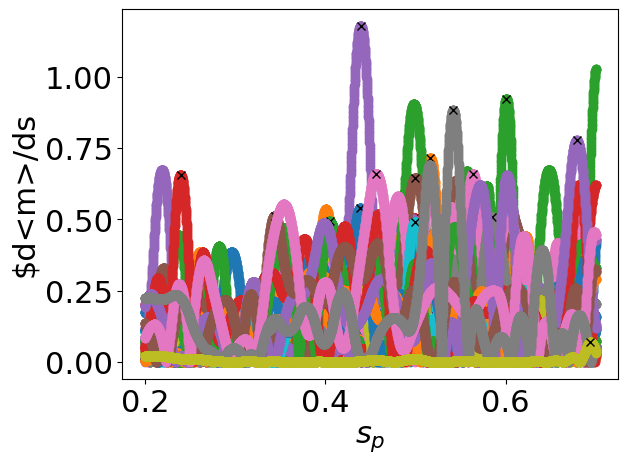

In [533]:
from scipy.interpolate import splrep, BSpline, splev
from scipy.signal import find_peaks

max_deriv_slocations_ra = []

for i in range(len(magarr_ra)):
    hoverj = hoverjlist_ra[i]
    yval = magarr_ra[i][0]
    
    tck = splrep(slist_ra, yval, s=0)
    xnew = np.linspace(0.2, 0.7, 100*len(slist_ra))
    ynew = splev(xnew, tck, der=0)
    ydiff = abs(np.gradient(ynew, xnew[1] - xnew[0]))
    plt.plot(xnew, ydiff, marker = 'o', label = ' h/J={}'.format(hoverj) )
    peaks, _ = find_peaks(ydiff, distance=30)
#     print(xnew[peaks],ydiff[peaks])
#     plt.plot(xnew[peaks], ydiff[peaks], "x", color = 'black')
    plt.plot(xnew[peaks][np.argmax(ydiff[peaks])], np.max(ydiff[peaks]), "x", color = 'black')
    if len(xnew[peaks]) == 0:
        max_deriv_slocations_ra.append(float('NaN'))
    elif np.max(ydiff[peaks]) > 0.05:
        max_deriv_slocations_ra.append( xnew[peaks][np.argmax(ydiff[peaks])] )
    else:
        max_deriv_slocations_ra.append(float('NaN'))

plt.xlabel(r'$s_p$')
plt.ylabel(r'$d<m>/ds')
# plt.legend()
plt.show()

0.0
0.1
0.2
0.3
0.4
0.5
0.6000000000000001
0.8
1.0
1.2000000000000002
1.4000000000000001
1.6
1.8
2.0
2.2
2.4000000000000004
2.6
2.8000000000000003
3.0


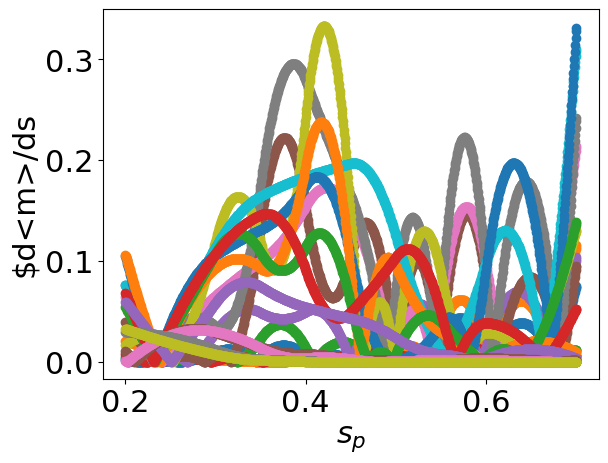

In [534]:
from scipy.interpolate import splrep, BSpline, splev
from scipy.signal import find_peaks

max_deriv_slocations_apq_Kvals = []

for i in range(len(Kval_arr)):
    hoverj = hoverjlist_ra[i]
    yval = Kval_arr[i][0]
    
    tck = splrep(slist_apq, yval, s=0)
    xnew = np.linspace(0.2, 0.7, 100*len(slist_apq))
    ynew = splev(xnew, tck, der=0)
    ydiff = abs(np.gradient(ynew, xnew[1] - xnew[0]))
    plt.plot(xnew, ydiff, marker = 'o', label = ' h/J={}'.format(hoverj) )
    peaks, _ = find_peaks(ydiff, distance=30)
#     plt.plot(xnew[peaks], ydiff[peaks], "x", color = 'black')
#     print(xnew[peaks][np.argmax(ydiff[peaks])], np.max(ydiff[peaks]))
#     plt.plot(xnew[peaks][np.argmax(ydiff[peaks])], np.max(ydiff[peaks]), "x", color = 'black')
    if len(xnew[peaks]) == 0:
        max_deriv_slocations_apq_Kvals.append(float('NaN'))
    elif np.max(ydiff[peaks]) > 0.015:
        max_deriv_slocations_apq_Kvals.append( xnew[peaks][np.argmax(ydiff[peaks])] )
    else:
        max_deriv_slocations_apq_Kvals.append(float('NaN'))

plt.xlabel(r'$s_p$')
plt.ylabel(r'$d<m>/ds')
# plt.legend()
plt.show()

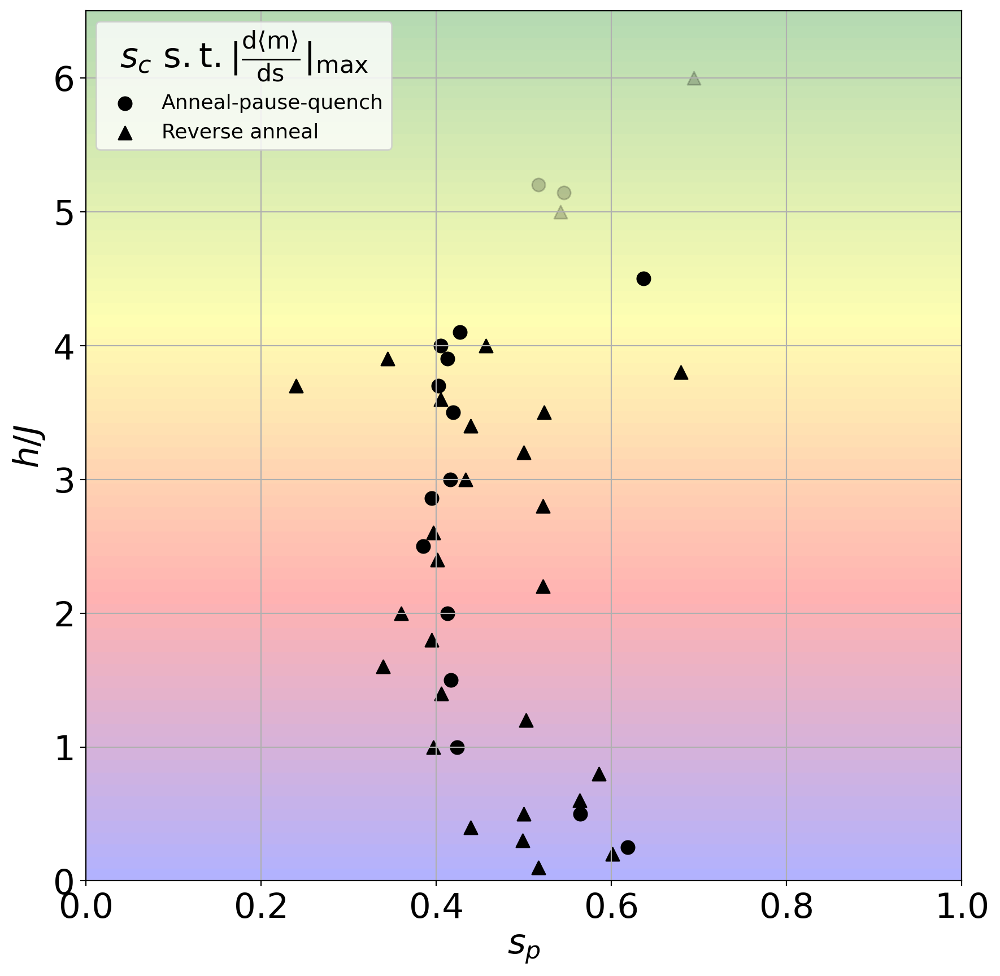

In [535]:
def func3(x, y):
    return y/6


# make these smaller to increase the resolution
dx, dy = 0.05, 0.05

x = np.arange(0.0, 1.01, dx)
y = np.arange(0.0, 6.51, dy)
X, Y = np.meshgrid(x, y)

# when layering multiple images, the images need to have the same
# extent.  This does not mean they need to have the same shape, but
# they both need to render to the same coordinate system determined by
# xmin, xmax, ymin, ymax.  Note if you use different interpolations
# for the images their apparent extent could be different due to
# interpolation edge effects

fig, ax = plt.subplots(figsize = (10,10), dpi=200)

extent = np.min(x), np.max(x), np.min(y), np.max(y)
Z2 = func3(X, Y)
plt.contourf(X, Y, Z2, 100, cmap=cmap, alpha=.3)

ms=70

plt.scatter(max_deriv_slocations_apq[-4:],hoverjlist_apq[-4:], 
            color='black', alpha = 0.2, label='', 
            s=ms)
plt.scatter(max_deriv_slocations_apq[1:-4],hoverjlist_apq[1:-4], 
            color='black',label= 'Anneal-pause-quench',
            s=ms)
plt.scatter(max_deriv_slocations_ra[-2:],hoverjlist_ra[-2:], 
            color='black',marker = '^', alpha = 0.2, label='', 
            s=ms)
plt.scatter(max_deriv_slocations_ra[1:-2],hoverjlist_ra[1:-2], 
            color='black',marker = '^', label='Reverse anneal', 
            s=ms)

plt.legend(title = r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle m \rangle} {ds}| _{\rm max} $', fontsize=13)
plt.grid()
plt.xlim((0,1))
plt.xlabel(r'$s_p$')
plt.ylabel(r'$h/J$')


plt.show()

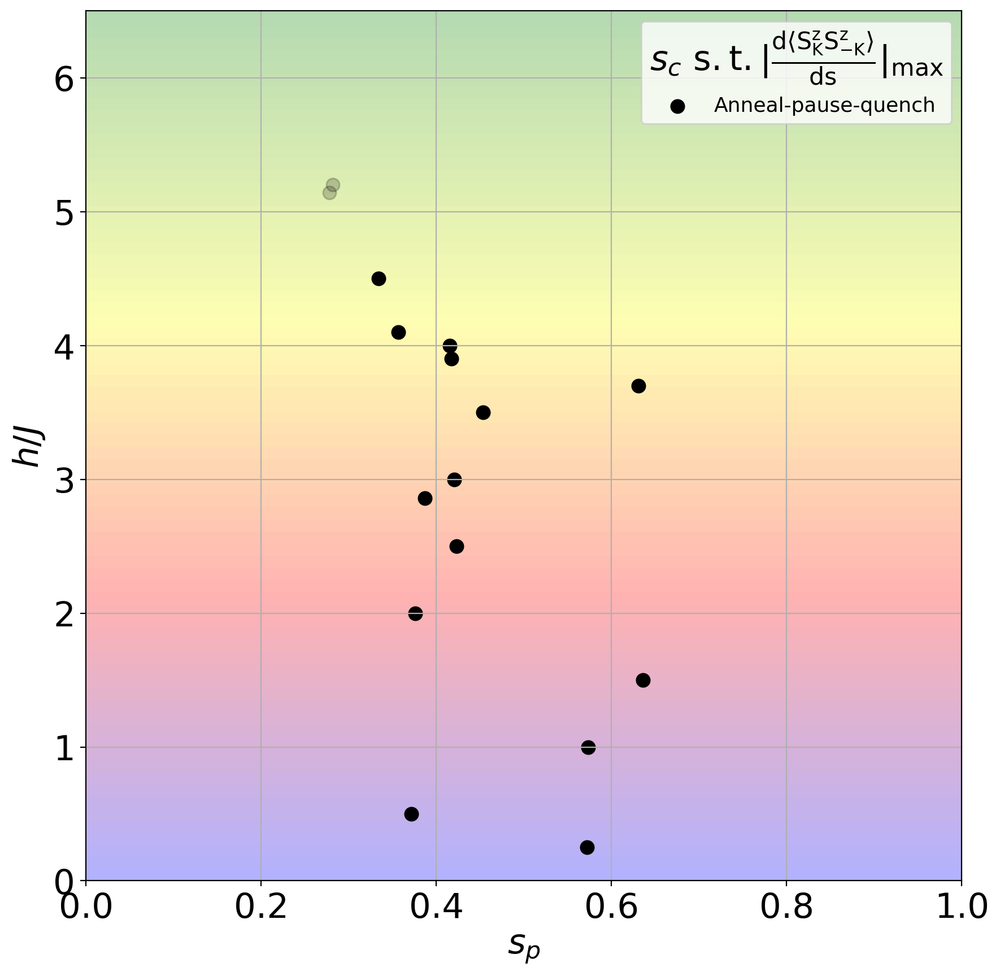

In [536]:
def func3(x, y):
    return y/6


# make these smaller to increase the resolution
dx, dy = 0.05, 0.05

x = np.arange(0.0, 1.01, dx)
y = np.arange(0.0, 6.51, dy)
X, Y = np.meshgrid(x, y)

# when layering multiple images, the images need to have the same
# extent.  This does not mean they need to have the same shape, but
# they both need to render to the same coordinate system determined by
# xmin, xmax, ymin, ymax.  Note if you use different interpolations
# for the images their apparent extent could be different due to
# interpolation edge effects

fig, ax = plt.subplots(figsize = (10,10), dpi=200)

extent = np.min(x), np.max(x), np.min(y), np.max(y)
Z2 = func3(X, Y)
plt.contourf(X, Y, Z2, 100, cmap=cmap, alpha=.3)

ms=70

plt.scatter(max_deriv_slocations_apq_Kvals[-4:],hoverjlist_apq[-4:], 
            color='black', alpha = 0.2, label='', 
            s=ms)
plt.scatter(max_deriv_slocations_apq_Kvals[1:-4],hoverjlist_apq[1:-4], 
            color='black',label= 'Anneal-pause-quench',
            s=ms)


plt.legend(title = r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle S_K^z S_{-K}^z \rangle} {ds}| _{\rm max} $', fontsize=13)
plt.grid()
plt.xlim((0,1))
plt.xlabel(r'$s_p$')
plt.ylabel(r'$h/J$')


plt.show()

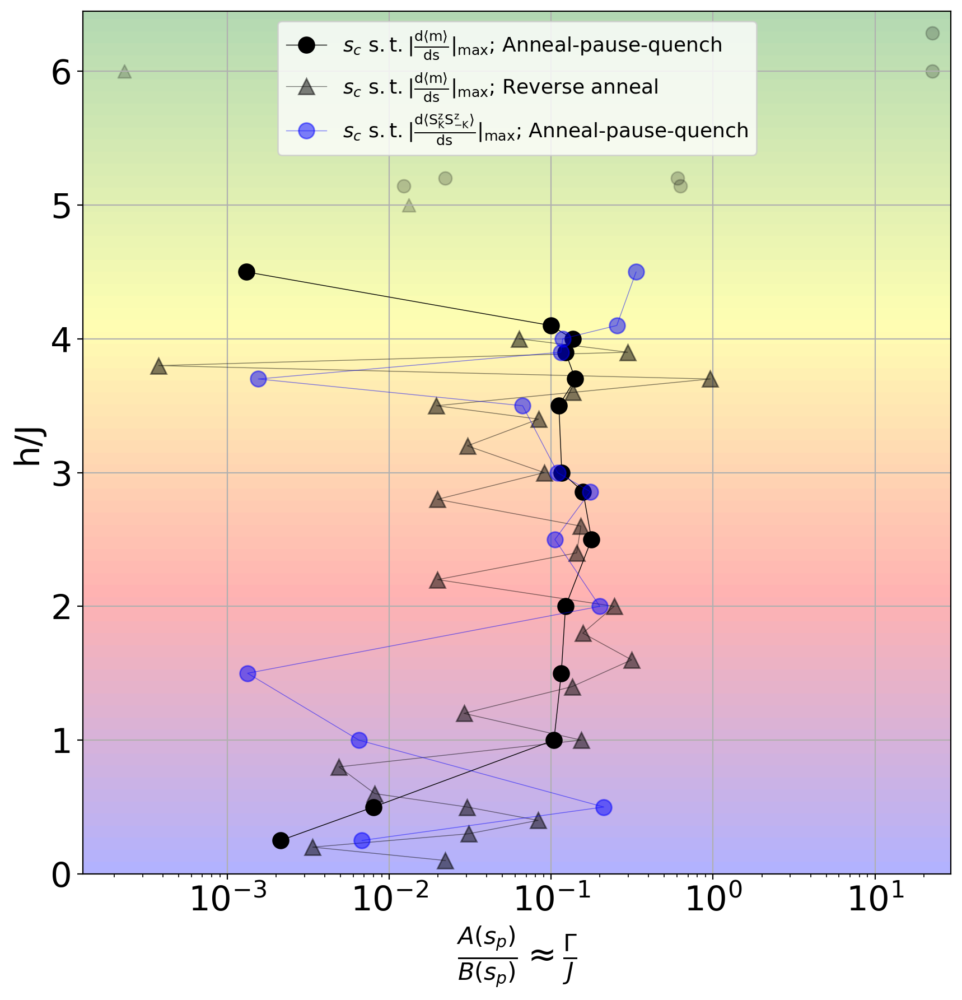

In [537]:
# make these smaller to increase the resolution
dx, dy = 0.5, 0.05

x = np.arange(0.0, 30, dx)
# x = np.arange(-0.005, 0.2, dx)
y = np.arange(0.0, 6.5, dy)
X, Y = np.meshgrid(x, y)

# when layering multiple images, the images need to have the same
# extent.  This does not mean they need to have the same shape, but
# they both need to render to the same coordinate system determined by
# xmin, xmax, ymin, ymax.  Note if you use different interpolations
# for the images their apparent extent could be different due to
# interpolation edge effects

fig, ax = plt.subplots(figsize = (10,10), dpi=200)

extent = np.min(x), np.max(x), np.min(y), np.max(y)
Z2 = func3(X, Y)
plt.contourf(X, Y, Z2, 100, cmap=cmap, alpha=.3)

ms=70
ms2=10
lw=0.5

AoverB = np.divide(new_A,new_B)
slist_indices = []
for i in range(len(max_deriv_slocations_apq)):
    slist_indices.append(find_nearest(new_s,max_deriv_slocations_apq[i]))
max_deriv_gammalocations_apq = AoverB[slist_indices]
slist_indices = []
for i in range(len(max_deriv_slocations_ra)):
    slist_indices.append(find_nearest(new_s,max_deriv_slocations_ra[i]))
max_deriv_gammalocations_ra = AoverB[slist_indices]


plt.scatter(max_deriv_gammalocations_apq[-4:],hoverjlist_apq[-4:], 
            color='black', alpha = 0.2, label='',
            s=ms)
plt.plot(max_deriv_gammalocations_apq[1:-4],hoverjlist_apq[1:-4], 
            color='black', marker = 'o', label= r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle m \rangle} {ds}| _{\rm max} $' 
         + '; Anneal-pause-quench',
            ms=ms2, lw=lw, alpha=1)
plt.scatter(max_deriv_gammalocations_ra[-2:],hoverjlist_ra[-2:], 
            color='black',marker = '^', alpha = 0.2, label='', 
            s=ms)
plt.plot(max_deriv_gammalocations_ra[1:-2],hoverjlist_ra[1:-2], 
            color='black',marker = '^', label= r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle m \rangle} {ds}| _{\rm max} $'
         + '; Reverse anneal', 
            ms=ms2, lw=lw, alpha=0.5)
         
plt.scatter(max_deriv_gammalocations_apq_Kvals[-4:],hoverjlist_apq[-4:], 
            color='black', alpha = 0.2, label='',
            s=ms)
plt.plot(max_deriv_gammalocations_apq_Kvals[1:-4],hoverjlist_apq[1:-4], 
            color='blue', marker = 'o', label= r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle S_K^z S_{-K}^z \rangle} {ds}| _{\rm max} $'
         + '; Anneal-pause-quench',
            ms=ms2, lw=lw,alpha=0.5)


plt.legend(fontsize=13)
plt.grid()
# plt.xlim((x[0],x[-1]))
plt.xscale('log')
plt.xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
plt.ylabel('h/J')


plt.show()

# APQ2

In [ ]:
slist=np.linspace(0.2,0.7,11)
hoverjlist = [1.0,3.0] #this is h/J

jlist1 = [1/np.max(J22_s)]
jlist2 = [0.2, 0.4, 0.8, 1.0]
jlist=sorted(jlist1+jlist2)

harr1=np.array([np.multiply(hoverjlist[0],jlist1),np.multiply(hoverjlist[1],jlist1)])
harr2=np.array([np.multiply(hoverjlist[0],jlist2),np.multiply(hoverjlist[1],jlist2)])

hlist1=harr1.flatten()
hlist2=harr2.flatten()
hlist=list(hlist1)+list(hlist2)

jlist_iter = jlist1+jlist1+jlist2+jlist2

print(hoverjlist)
print(hlist1)
print(hlist2)
print(hlist)

In [ ]:
cvals  = sorted(list(set(jlist_iter)))
colors = ["blue", "purple", "red", "yellow", "green"]
norm=plt.Normalize(min(cvals),max(cvals))
tuples = list(zip(map(norm,cvals), colors))
cmap = mc.LinearSegmentedColormap.from_list("", tuples)


In [ ]:
processed_folder1 = "/Users/prathunarasimhan/Library/CloudStorage/GoogleDrive-pn187@scarletmail.rutgers.edu/My Drive/Kagome data /APQ1/processed4"
processed_folder2 = "/Users/prathunarasimhan/Desktop/APQ2/processed"

In [41]:
ener_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class1_arr=np.zeros(shape=(len(hlist),2,len(slist)))
ener_class2_arr=np.zeros(shape=(len(hlist),2,len(slist)))
# all_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
# downtri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
gooddowntri_mag_arr=np.zeros(shape=(len(hlist),2,len(slist)))
broken_arr=np.zeros(shape=(len(hlist),2,len(slist)))
phi_arr=np.zeros(shape=(len(hlist),2,len(slist)))
phi_angle_arr=np.zeros(shape=(len(hlist),2,len(slist)))


for i in range(len(hlist)):
    hplot=hlist[i]
    jplot=jlist_iter[i]
    
    for j in range(len(slist)):
        splot=round(slist[j],2)
        
        if i == 0 or i == 1:
            folder = processed_folder1
            name_file = folder + "/h1={}_s={}_processed.hdf5".format(hplot, splot)
        else:
            hplot=round(hplot,2)
            folder = processed_folder2
            name_file = folder + "/h1={}_j={}_s={}_processed.hdf5".format(hplot, jplot, splot)
            
        data = h5py.File(name_file, 'r')

        
        
        ener_arr[i][0][j] = np.mean(np.array(data['energies']))
        ener_arr[i][1][j] = np.std(np.array(data['energies']))
        
        ener_class1_arr[i][0][j] = np.mean(np.array(data['energy_classical1']))
        ener_class1_arr[i][1][j] = np.std(np.array(data['energy_classical1']))
        
        ener_class2_arr[i][0][j] = np.mean(np.array(data['energy_classical2']))
        ener_class2_arr[i][1][j] = np.std(np.array(data['energy_classical2']))
        
#         all_mag_arr[i][0][j] = np.mean(np.array(data['all_magnetization'])[:,100:])
#         all_mag_arr[i][1][j] = np.std(np.array(data['all_magnetization'])[:,100:])
        
#         downtri_mag_arr[i][0][j] = np.mean(np.array(data['down_triangle_magnetization'])[:,100:])
#         downtri_mag_arr[i][1][j] = np.std(np.array(data['down_triangle_magnetization'])[:,100:])
        
        gooddowntri_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization']))
        gooddowntri_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization']))
        
        broken_arr[i][0][j] = np.mean(np.array(data['avg_broken']))
        broken_arr[i][1][j] = np.std(np.array(data['avg_broken']))
        
        phi_arr[i][0][j]=np.mean(np.abs(np.array(data['phis'])))/3
        phi_arr[i][1][j]=np.std(np.abs(np.array(data['phis'])))/3
        
        phi_angle_arr[i][0][j]=np.mean(np.angle(np.array(data['phis'])))
        

NameError: name 'jlist_iter' is not defined

In [42]:
plt.figure(figsize=(10,10), dpi=200)

handles=[]

for i in range(len(ener_arr)):
    h=hlist[i]
    j=jlist_iter[i]
    hoverj=round(h/j,2)
    
    c=plt.cm.viridis(j)
    lw=0.5
    capsize=5
    alpha=0.8
    ecolor='black'
    markeredgecolor='black'
    elinewidth=2
    
    if hoverj == 1:
        handle = plt.errorbar(
            gammalist,
            ener_class1_arr[i][0],
            ener_class1_arr[i][1]/2,
            marker='o',
            ms=10,
            c=c,
            lw=0.5,
            capsize=capsize,
            ecolor=ecolor,
            markeredgecolor=markeredgecolor,
            elinewidth=elinewidth,
            alpha=alpha,
        )
    else:
        handle = plt.errorbar(
            gammalist,
            ener_class1_arr[i][0],
            ener_class1_arr[i][1]/2,
            marker='*',
            ms=15,
            c=c,
            lw=0.5,
            capsize=capsize,
            ecolor=ecolor,
            markeredgecolor=markeredgecolor,
            elinewidth=elinewidth,
            alpha=alpha,
        )
    handles.append(handle)
        
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots  
xlabel=r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $'
ylabel=r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $'
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.legend(handles, [1.0,3.0], title= r'$ h/J= $')
plt.xscale('log')
plt.grid()

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(jlist)
plt.colorbar(sm, label=r'$ J $')

    
plt.show()
        

NameError: name 'jlist_iter' is not defined

In [43]:
plt.figure(figsize=(10,10), dpi=200)

handles=[]

for i in range(len(ener_arr)):
    h=hlist[i]
    j=jlist_iter[i]
    hoverj=round(h/j,2)
    
    c=plt.cm.viridis(j)
    lw=0.5
    capsize=5
    alpha=0.8
    ecolor='black'
    markeredgecolor='black'
    elinewidth=2
    
    if hoverj == 1:
        handle = plt.errorbar(
            gammalist,
            gooddowntri_mag_arr[i][0],
            gooddowntri_mag_arr[i][1]/2,
            marker='o',
            ms=10,
            c=c,
            lw=0.5,
            capsize=capsize,
            ecolor=ecolor,
            markeredgecolor=markeredgecolor,
            elinewidth=elinewidth,
            alpha=alpha,
        )
    else:
        handle = plt.errorbar(
            gammalist,
            gooddowntri_mag_arr[i][0],
            gooddowntri_mag_arr[i][1]/2,
            marker='*',
            ms=15,
            c=c,
            lw=0.5,
            capsize=capsize,
            ecolor=ecolor,
            markeredgecolor=markeredgecolor,
            elinewidth=elinewidth,
            alpha=alpha,
        )
    handles.append(handle)
        
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots                
xlabel=r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $'
ylabel=r'$ \langle m \rangle $'
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.legend(handles, [1.0,3.0], title= r'$ h/J= $')
plt.xscale('log')
plt.grid()

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis)
sm.set_array(jlist)
plt.colorbar(sm, label=r'$ J $')

    
plt.show()
        

NameError: name 'jlist_iter' is not defined

In [44]:
from scipy.interpolate import InterpolatedUnivariateSpline

fig,ax=plt.subplots(2, figsize=(10,10), dpi=200)

max_deriv_slocations1 = []
max_deriv_slocations3 = []

count1=0
count3=0
    
for i in range(len(gooddowntri_mag_arr)):
    hval=hlist[i]
    jval=jlist_iter[i]
    hoverj=round(hval/jval,2)
    
    x = slist
    x_plot = np.linspace(0.3 + 0.025, 0.7-0.025, 40)
    y = gooddowntri_mag_arr[i][0] 
    f = InterpolatedUnivariateSpline(x, y, k=5)
    
    if jval ==0.2:
        pass
    else:
    
        if hoverj ==1:
            ax[0].plot(
                x_plot, 
                np.abs(f.derivative(1)(x_plot))/np.max(np.abs(f.derivative(1)(x_plot))), 
                c=plt.cm.inferno(count1/5), label = round(jval,2)
            )
            max_deriv_slocations1.append(x_plot[np.argmax(np.abs(f.derivative(1)(x_plot)))])
            count1+=1

        else:
            ax[1].plot(
                x_plot, 
                np.abs(f.derivative(1)(x_plot))/np.max(np.abs(f.derivative(1)(x_plot))), 
                c=plt.cm.inferno(count3/5), label = round(jval,2)
            )
            max_deriv_slocations3.append(x_plot[np.argmax(np.abs(f.derivative(1)(x_plot)))])
            count3+=1
    
    
for axis in ax.flat:
    axis.set_xlim((0,1))
    axis.legend()

plt.show()

NameError: name 'jlist_iter' is not defined

In [45]:
# def func3(x, y):
#     return y/6


# # make these smaller to increase the resolution
# dx, dy = 0.05, 0.05

# x = np.arange(0.0, 1.01, dx)
# y = np.arange(0.0, 1.01, dy)
# X, Y = np.meshgrid(x, y)

# when layering multiple images, the images need to have the same
# extent.  This does not mean they need to have the same shape, but
# they both need to render to the same coordinate system determined by
# xmin, xmax, ymin, ymax.  Note if you use different interpolations
# for the images their apparent extent could be different due to
# interpolation edge effects

fig, ax = plt.subplots(figsize = (10,10), dpi=200)

# extent = np.min(x), np.max(x), np.min(y), np.max(y)
# Z2 = func3(X, Y)
# plt.contourf(X, Y, Z2, 100, cmap=cmap, alpha=.3)

ms=70

slist_indices1 = []
slist_indices3 = []
for i in range(len(max_deriv_slocations1)):
    slist_indices1.append(find_nearest(new_s,max_deriv_slocations1[i]))
for i in range(len(max_deriv_slocations3)):
    slist_indices3.append(find_nearest(new_s,max_deriv_slocations3[i]))
AoverB = np.divide(new_A,new_B)
max_deriv_gammalocations1 = AoverB[slist_indices1]
max_deriv_gammalocations3 = AoverB[slist_indices3]

jlist_plot = jlist[1:]

plt.scatter(np.divide(max_deriv_gammalocations1,1),1/np.array(jlist_plot), 
            color='blue',marker = 's', 
            label=r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle m \rangle} {ds}| _{\rm max}; h/J=1.0 $', 
            s=ms)
plt.scatter(np.divide(max_deriv_gammalocations3,1),1/np.array(jlist_plot), 
            color='red',
            label=r'$ s_c $' + r' $ \rm s.t. |\frac {d \langle m \rangle} {ds}| _{\rm max}; h/J=3.0 $',
            s=ms)
plt.legend()
plt.grid()
# plt.xscale('log')
plt.xlabel(r'$  \frac {A(s_p)} { B(s_p)} $')
plt.ylabel(r'$1/J$')


plt.show()

NameError: name 'jlist' is not defined

victors data

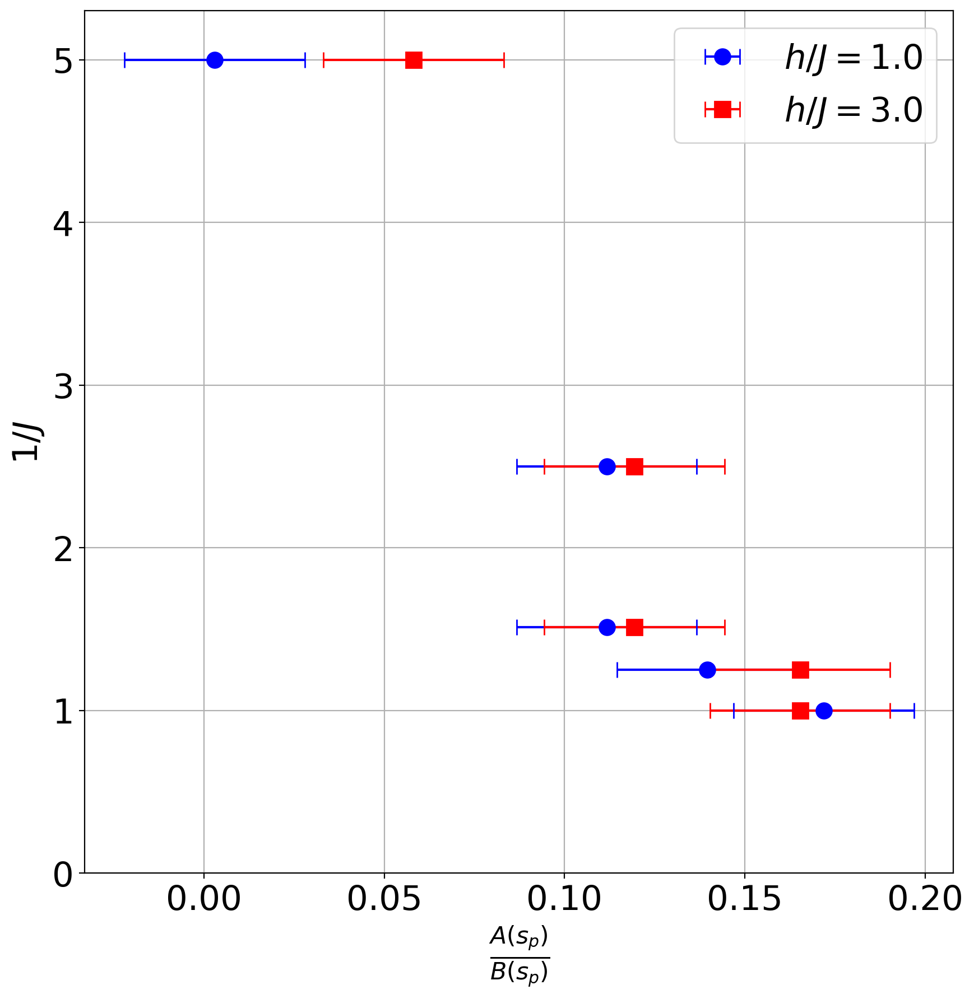

In [533]:
fig, ax = plt.subplots(figsize = (10,10), dpi=200)


y= 1/np.array(jlist)
s1= [0.60625,0.41875,0.41875,0.403125,0.3875]
s3= [0.46190476,0.41428571,0.41428571,0.39047619,0.39047619]

ms=10

slist_indices1 = []
slist_indices3 = []
for i in range(len(s1)):
    slist_indices1.append(find_nearest(new_s,s1[i]))
for i in range(len(s3)):
    slist_indices3.append(find_nearest(new_s,s3[i]))
AoverB = np.divide(new_A,new_B)
gamma1 = AoverB[slist_indices1]
gamma3 = AoverB[slist_indices3]


plt.errorbar(gamma1,
            y, 
            xerr= 0.025*np.ones(len(y)),
            color='blue', 
            label=r'$ h/J=1.0 $', 
            ms=ms,
            marker='o',
            ls='',
            capsize=5)
plt.errorbar(gamma3,
            y, 
            xerr= 0.025*np.ones(len(y)),
            color='red',
            label=r'$ h/J=3.0 $',
            ms=ms,
            marker='s',
            ls='',
            capsize=5)
plt.legend()
plt.grid()
plt.ylim((0,5.3))
# plt.xscale('log')
plt.xlabel(r'$  \frac {A(s_p)} { B(s_p)} $')
plt.ylabel(r'$1/J$')


plt.show()

# APQ redo 1

In [51]:
slist=np.linspace(0.2,0.7,11)
slist_apq = slist

hoverjlist = np.linspace(0,3,13)
hlist = list(hoverjlist / np.max(J22_s))

print(hoverjlist)
print(hlist)

[0.   0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.  ]
[0.0, 0.16534254240962615, 0.3306850848192523, 0.49602762722887844, 0.6613701696385046, 0.8267127120481308, 0.9920552544577569, 1.157397796867383, 1.3227403392770092, 1.4880828816866354, 1.6534254240962616, 1.8187679665058876, 1.9841105089155138]


In [52]:
cvals  = [0., 1.0, 2.0, 3.0]
colors = ["blue","red","yellow", "green"]
norm=plt.Normalize(min(cvals),max(cvals))
tuples = list(zip(map(norm,cvals), colors))
cmap = mc.LinearSegmentedColormap.from_list("", tuples)


In [53]:
slist_indices = []
for i in range(len(slist)):
    slist_indices.append(find_nearest(new_s,slist[i]))
AoverB = np.divide(new_A,new_B)
gammalist = AoverB[slist_indices]


In [54]:
processed_folder = "/Users/prathunarasimhan/Desktop/APQ redo 1/processed"

In [55]:
base_arr = float('nan') * np.ones(shape=(len(hlist),2,len(slist)))
# base_arr = np.zeros(shape=(len(hlist),2,len(slist)))

ener_arr = base_arr.copy()
ener_class1_arr = base_arr.copy()
ener_class2_arr = base_arr.copy()

gooddowntri_mag_arr = base_arr.copy()
good_down_tri_mag_sq_arr = base_arr.copy()
good_down_tri_mag_fo_arr = base_arr.copy()
all_sites_mag_arr = base_arr.copy()
all_down_triangle_mag_arr = base_arr.copy()
all_onechains_mag_arr = base_arr.copy()
all_twochains_mag_arr = base_arr.copy()
all_down_tri_onechains_mag_arr = base_arr.copy()
all_down_tri_twochains_mag_arr = base_arr.copy()
good_down_tri_onechains_mag_arr = base_arr.copy()
good_down_tri_twochains_mag_arr = base_arr.copy()

broken_arr = base_arr.copy()

phi_arr = base_arr.copy()
phi_angle_arr = base_arr.copy()

Mval_arr = base_arr.copy()
Kval_arr = base_arr.copy()

for i in range(len(hlist)):
    hplot=hlist[i]
    
    for j in range(len(slist)):
        splot=slist[j]
        
        try:
            name_file = processed_folder + "/h1={}_s={}_processed.hdf5".format(hplot, round(splot,2))
            data = h5py.File(name_file, 'r')



            ener_arr[i][0][j] = np.mean(np.array(data['energies']))
            ener_arr[i][1][j] = np.std(np.array(data['energies']))

            ener_class1_arr[i][0][j] = np.mean(np.array(data['energy_classical1']))
            ener_class1_arr[i][1][j] = np.std(np.array(data['energy_classical1']))

            ener_class2_arr[i][0][j] = np.mean(np.array(data['energy_classical2']))
            ener_class2_arr[i][1][j] = np.std(np.array(data['energy_classical2']))



            gooddowntri_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization']))
            gooddowntri_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization']))

            good_down_tri_mag_sq_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])**2)
            good_down_tri_mag_sq_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])**2)

            good_down_tri_mag_fo_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_magnetization'])**4)
            good_down_tri_mag_fo_arr[i][1][j] = np.std(np.array(data['good_down_triangle_magnetization'])**4)

            all_sites_mag_arr[i][0][j] = np.mean(np.array(data['all_sites_magnetization']))
            all_sites_mag_arr[i][1][j] = np.std(np.array(data['all_sites_magnetization']))

            all_down_triangle_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_magnetization']))
            all_down_triangle_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_magnetization']))

            all_onechains_mag_arr[i][0][j] = np.mean(np.array(data['all_onechains_magnetization']))
            all_onechains_mag_arr[i][1][j] = np.std(np.array(data['all_onechains_magnetization']))

            all_twochains_mag_arr[i][0][j] = np.mean(np.array(data['all_twochains_magnetization']))
            all_twochains_mag_arr[i][1][j] = np.std(np.array(data['all_twochains_magnetization']))

            all_down_tri_onechains_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_onechains_magnetization']))
            all_down_tri_onechains_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_onechains_magnetization']))

            all_down_tri_twochains_mag_arr[i][0][j] = np.mean(np.array(data['all_down_triangle_twochains_magnetization']))
            all_down_tri_twochains_mag_arr[i][1][j] = np.std(np.array(data['all_down_triangle_twochains_magnetization']))

            good_down_tri_onechains_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_onechains_magnetization']))
            good_down_tri_onechains_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_onechains_magnetization']))

            good_down_tri_twochains_mag_arr[i][0][j] = np.mean(np.array(data['good_down_triangle_twochains_magnetization']))
            good_down_tri_twochains_mag_arr[i][1][j] = np.std(np.array(data['good_down_triangle_twochains_magnetization']))



            broken_arr[i][0][j] = np.mean(np.array(data['avg_broken']))
            broken_arr[i][1][j] = np.std(np.array(data['avg_broken']))

            phi_arr[i][0][j]=np.mean(np.abs(np.array(data['phis'])))/3
            phi_arr[i][1][j]=np.std(np.abs(np.array(data['phis'])))/3

            phi_angle_arr[i][0][j]=np.mean(np.angle(np.array(data['phis'])))

            Mval_arr[i][0][j] = np.mean(np.array(data['Mvals']))
            Mval_arr[i][1][j] = np.std(np.array(data['Mvals']))

            Kval_arr[i][0][j] = np.mean(np.array(data['Kvals']))
            Kval_arr[i][1][j] = np.std(np.array(data['Kvals']))    
        except FileNotFoundError:
            print(hplot, splot)
            pass

1.9841105089155138 0.7


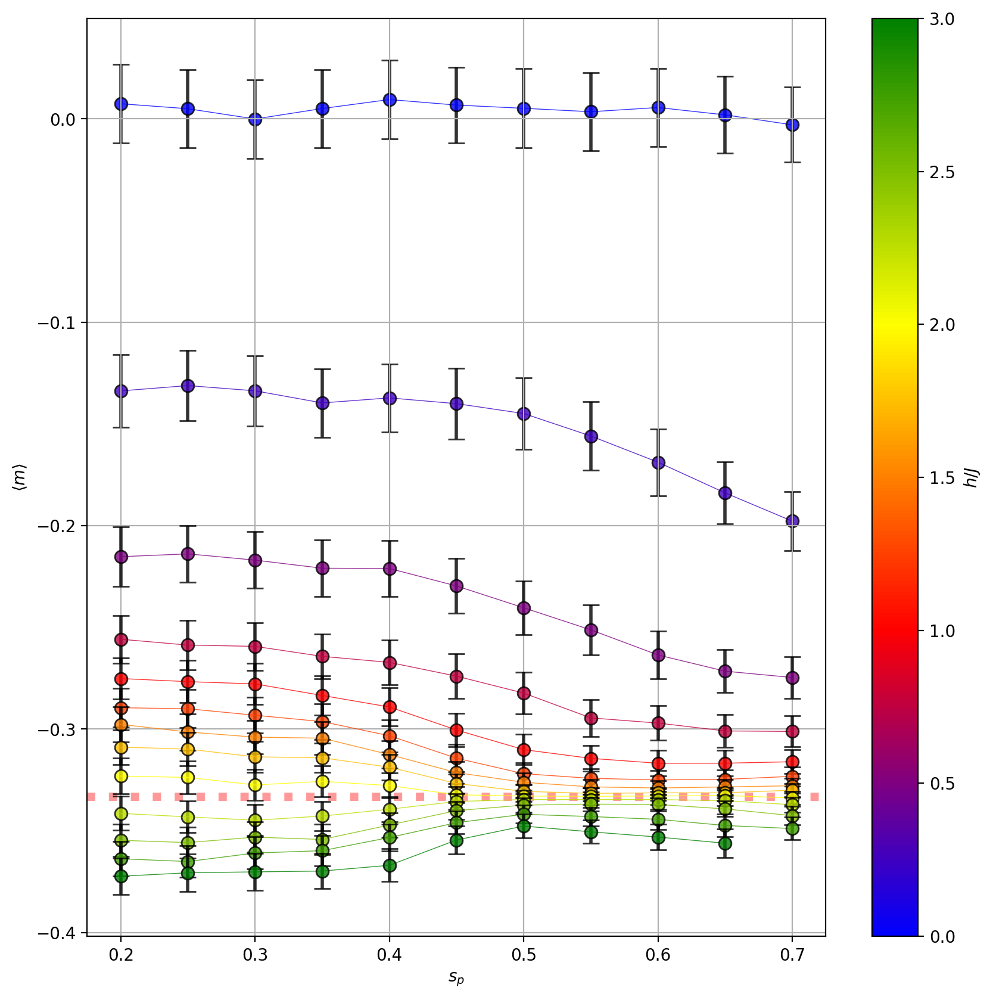

In [72]:
plt.figure(figsize=(10,10), dpi=200)
magarr = gooddowntri_mag_arr

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(magarr)):
    hoverj = hoverjlist[i]
    
    x=slist
    y=magarr[i][0]
    
    error=np.std(y)

    
    plt.errorbar(
        x,
        y,
        yerr=magarr[i][1]/2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        ms=15,
        lw=0.5,
        fmt='.-',
        capsize=5,
        alpha=0.8,
        ecolor='black',
        markeredgecolor='black',
        elinewidth=2
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots    
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ \langle m \rangle $')
# plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


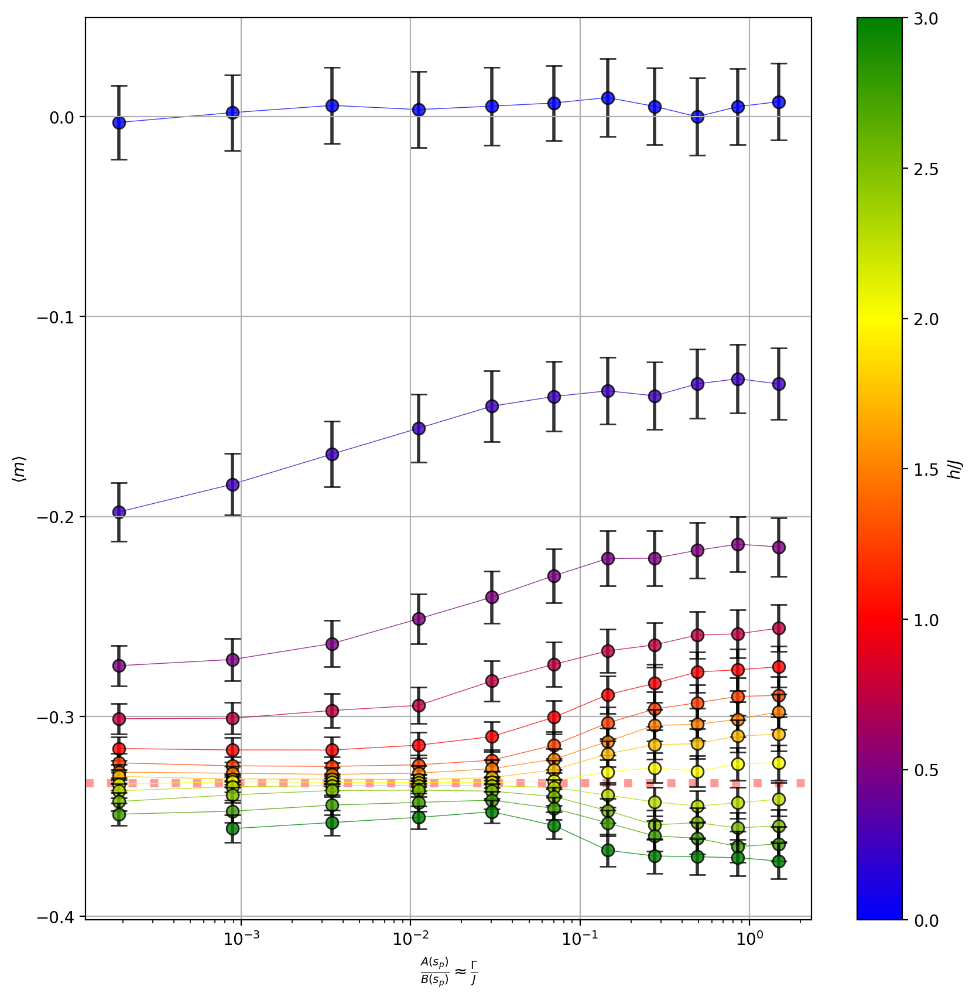

In [57]:
plt.figure(figsize=(10,10), dpi=200)
magarr = gooddowntri_mag_arr

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(magarr)):
    hoverj = hoverjlist[i]
    
    x=slist
    y=magarr[i][0]
    
    error=np.std(y)

    
    plt.errorbar(
        gammalist,
        y,
        yerr=magarr[i][1]/2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        ms=15,
        lw=0.5,
        fmt='.-',
        capsize=5,
        alpha=0.8,
        ecolor='black',
        markeredgecolor='black',
        elinewidth=2
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots    
plt.grid()
plt.xlabel(r'$  \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $' )
plt.ylabel(r'$ \langle m \rangle $')
plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


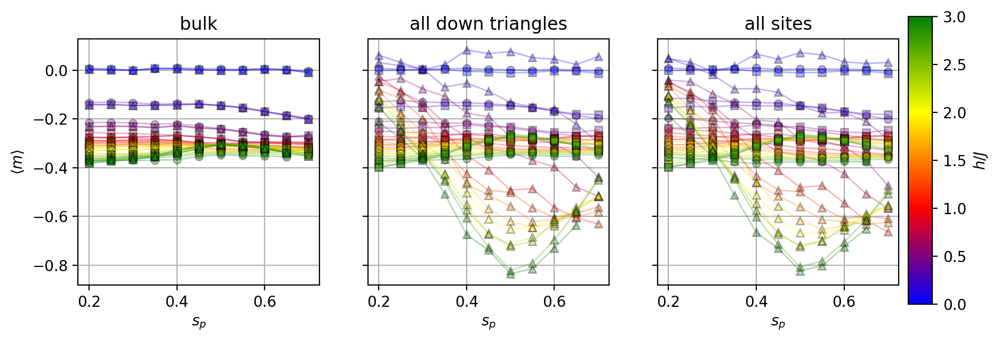

In [58]:
fig, ax = plt.subplots(1,3, figsize=(9,3), dpi=200, sharey=True, )

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(hoverjlist)):
    hoverj = hoverjlist[i]
    x=slist
    
    lw=1
    ms=5
    mec='black'
    alpha = 0.3
    labels = ['onechains and twochains', 'onechains', 'twochains']
    
    ax[0].set(title = 'bulk', ylabel=r'$ \langle m \rangle $')
    ax[0].plot(
        x,
        gooddowntri_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[0].plot(
        x,
        good_down_tri_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[0].plot(
        x,
        good_down_tri_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
    ax[1].set(title = 'all down triangles')
    ax[1].plot(
        x,
        all_down_triangle_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[1].plot(
        x,
        all_down_tri_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[1].plot(
        x,
        all_down_tri_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
    ax[2].set(title = 'all sites')
    ax[2].plot(
        x,
        all_sites_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 'o',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[0]
    )
    ax[2].plot(
        x,
        all_onechains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = 's',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[1]
    )
    ax[2].plot(
        x,
        all_twochains_mag_arr[i][0],
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        marker = '^',
        lw=lw,
        alpha=alpha,
        markeredgecolor=mec,
        ms=ms,
        label = labels[2]
    )
        

for axis in ax.flat:
#     axis.set_xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
    axis.set_xlabel(r'$ s_p $')
#     axis.set_xscale('log')
    axis.grid()
#     axis.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)


# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)

fig.subplots_adjust(right=0.98)
cbar_ax = fig.add_axes([0.99, 0.05, 0.025, 0.9])
fig.colorbar(sm, label=r'$ h/J $', cax=cbar_ax)




plt.show()

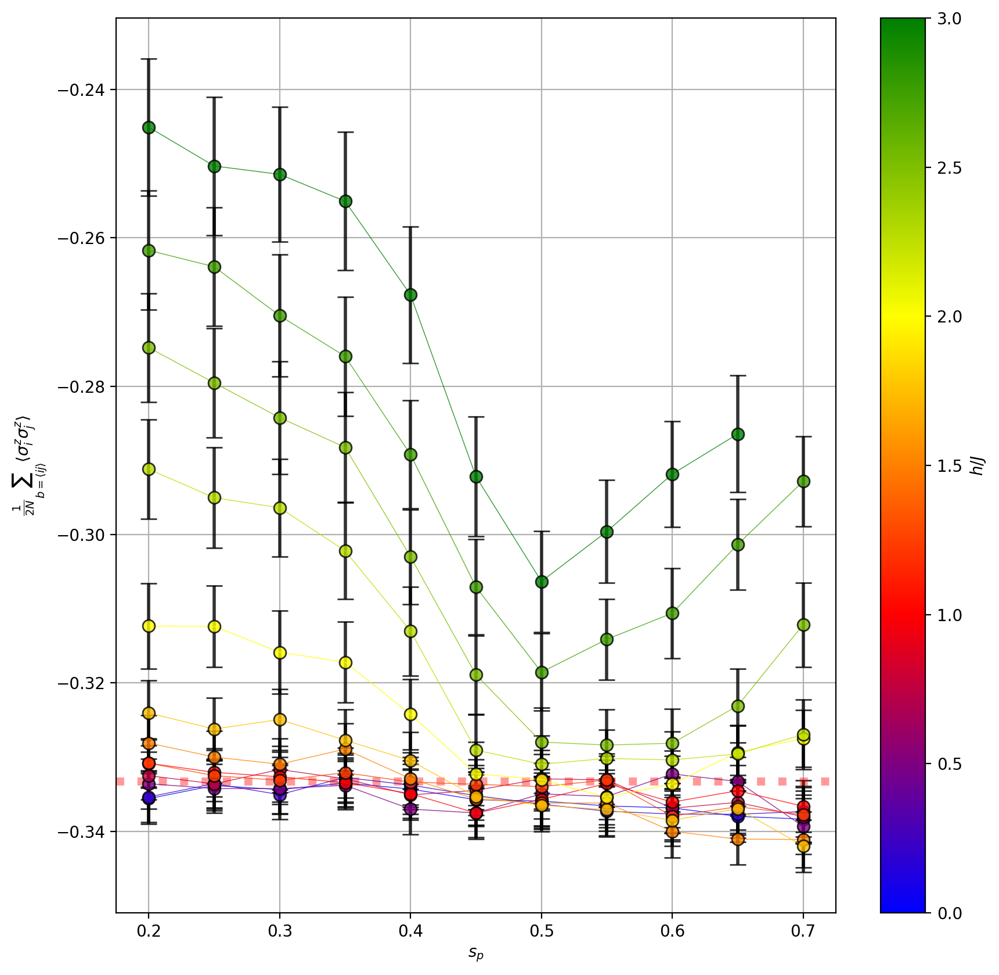

In [60]:
plt.figure(figsize=(10,10), dpi=200)
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class1_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        slist, 
        ener_class1_arr[i][0],
        yerr = ener_class1_arr[i][1]/3,
        label = round(hoverj, 1),
        c = cmap(hoverjlist[i]/hoverjlist[-1]),
        alpha = 0.8,
        markersize=15,
        markeredgecolor='black',
        capsize=5,
        elinewidth=2,
        ecolor='black',
        lw=0.5,
        fmt='.-'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.grid()
plt.xlabel(r'$ s_p $')
plt.ylabel(r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $')
# plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


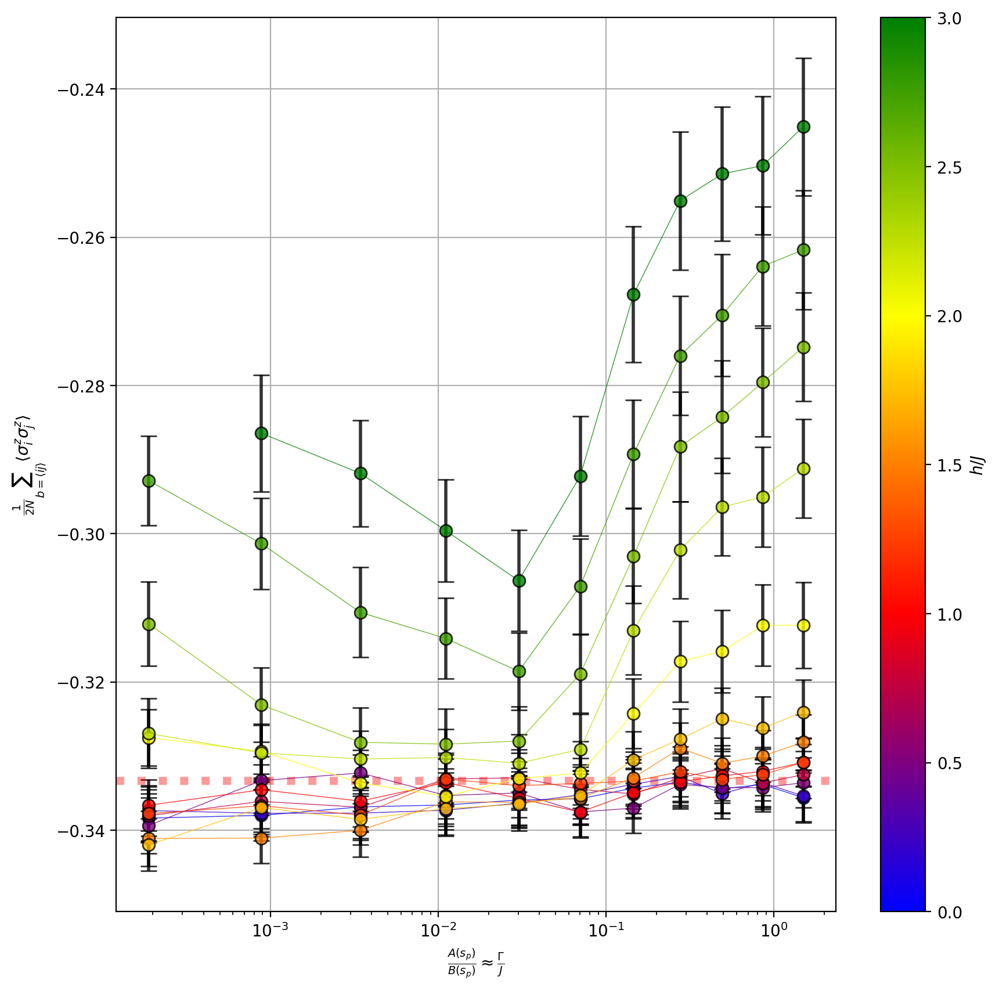

In [62]:
plt.figure(figsize=(10,10), dpi=200)
colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(ener_class1_arr)):
    hoverj = hoverjlist[i]
    plt.errorbar(
        gammalist, 
        ener_class1_arr[i][0],
        yerr = ener_class1_arr[i][1]/3,
        label = round(hoverj, 1),
        c = cmap(hoverjlist[i]/hoverjlist[-1]),
        alpha = 0.8,
        markersize=15,
        markeredgecolor='black',
        capsize=5,
        elinewidth=2,
        ecolor='black',
        lw=0.5,
        fmt='.-'
    )
    
plt.axhline(y=-1/3, color='r', linestyle='dotted', alpha=0.4, lw=5)  # Extend horizontal line across the plots
plt.grid()
plt.xlabel(r'$  \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $' )
plt.ylabel(r'$ \frac {1}{2N}  \sum_{b=\langle ij \rangle} \langle \sigma_i^z \sigma_j^z \rangle $')
plt.xscale('log')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)  # Set hoverjlist as the array for the colorbar
plt.colorbar(sm, label=r'$ h/J $')

plt.show()


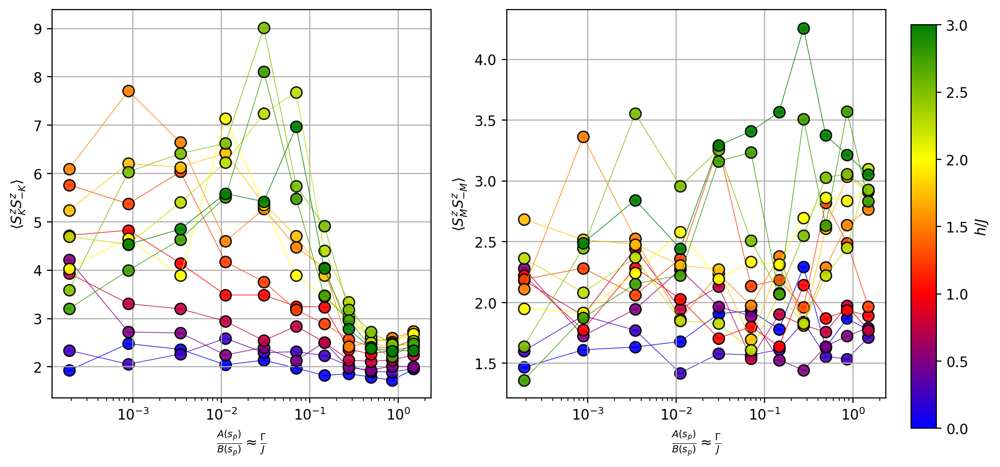

In [81]:
fig, ax = plt.subplots(1,2, figsize=(10,5), dpi=200)

colors = np.linspace(0, 1, len(hoverjlist))

for i in range(len(hoverjlist)):
    hoverj = hoverjlist[i]
    
    x=gammalist
    y1=Kval_arr[i][0]*231
    yerr1=Kval_arr[i][1]/3
    y2=Mval_arr[i][0]*231
    yerr2=Mval_arr[i][1]/3
    
    elc='black'
    mec='black'
    elw=1
    ms=8
    cs=2
    
    ax[0].errorbar(
        x,
        y1,
        yerr=yerr1,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        marker = 'o',
        lw=0.5,
        alpha=0.9,
        markeredgecolor=mec,
        elinewidth=elw,
        ms=ms,
        capsize=cs
    )
    ax[0].set_ylabel(r'$ \langle S_K^z S_{-K}^z \rangle $')
    ax[1].errorbar(
        x,
        y2,
        yerr=yerr2,
        label=round(hoverj, 1),
        c= cmap(hoverjlist[i]/hoverjlist[-1]),
        zorder = i,
        marker = 'o',
        lw=0.5,
        alpha=0.9,
        markeredgecolor=mec,
        elinewidth=elw,
        ms=ms,
        capsize=cs
        
    )
    ax[1].set_ylabel(r'$ \langle S_M^z S_{-M}^z \rangle $')

for axis in ax.flat:
    axis.set_xlabel(r'$ \frac {A(s_p)} {B(s_p)} \approx \frac {\Gamma}{J} $')
    axis.set_xscale('log')
    axis.grid()


# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(hoverjlist)

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.975, 0.05, 0.025, 0.8])
fig.colorbar(sm, label=r'$ h/J $', cax=cbar_ax)


plt.show()